# **Project Name**    - Seoul Bike Sharing Demand Prediction



##### **Project Type**    - Regression
##### **Contribution**    - Individual
##### **Asif Tadavi**     - asifstadavi@gmail.com

# **Project Summary -**

#### **The Almabetter team assigned me a project with the objective of gaining insights into bike sharing systems.These systems involve automated processes for membership acquisition, bike rental, and bike return across a city. Through these systems, individuals can rent a bike from one location and return it to another.The dataset provided, known as "Seoul bike data," includes a column named "Rented bike count," which serves as our target variable, while the other columns are considered independent variables. Our goal is to utilize various machine learning techniques to predict the hourly count of rented bikes.**
#### **Upon reviewing the dataset, it appears that some preprocessing is necessary before we can use the data. However, it's worth noting that there are no missing or null values in the dataset.In the next step, we need to perform Exploratory Data Analysis (EDA). During this process, I noticed that the "hour" column, although initially considered numerical, should be treated as a categorical feature. This adjustment is crucial because, when left as numerical, it didn't yield accurate results in subsequent analyses.**
#### **Additionally, we need to address multicollinearity in the dataset. Specifically, the columns "temperature" and "dew point temperature" exhibit a high degree of correlation. To mitigate this issue and avoid affecting the model's outcome, we should consider removing one of these columns.**
#### **The dataset has been divided into a training set and a testing set to enhance model accuracy. I have established evaluation metrics, including Mean Squared Error (MSE), Root Mean Squared Error (RMSE), Mean Absolute Scaled Error (MASE), R-Squared, Adjusted R-Squared, Best-params, and Best-score, to assess the performance of different models.**
#### **Although Linear Regression was initially employed as a baseline model, it was recognized that this approach may not be suitable. As a result, other models were fitted as reference points to gauge their performance.**
#### **To mitigate overfitting and achieve optimal outcomes, regularization techniques like Lasso and Ridge regression were employed. Multiple Linear Regression was also applied, yielding improved results.**





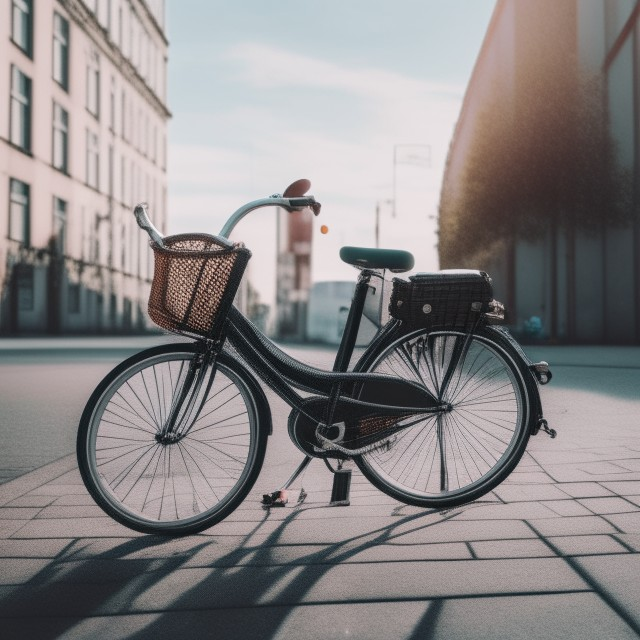

# **GitHub Link -** https://github.com/asifstadavi/EDA-BIKE_DEMAND_PREDICATION

# **Problem Statement**


#### **In many urban cities, rental bikes have been introduced to enhance mobility comfort, and ensuring their availability and accessibility is crucial to reduce waiting times.**
#### **The challenge lies in maintaining a stable supply of rental bikes, making accurate hourly predictions for bike demand essential.**
#### **Seoul, South Korea's bike-sharing program faces low utilization rates and resource inefficiencies.my project's goal is to develop a precise predictive model that forecasts bike rental demand by leveraging historical usage patterns, weather data, and relevant factors.**
#### **By doing so, we aim to help optimize the bike-sharing program, enhancing user satisfaction while reducing operational costs.**

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [3]:
# Importing required Libraries
import pandas as pd
import numpy as np
from datetime import datetime as dt

# Import Visualization Libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Perform Statistical Test to obtain P-Value
from scipy.stats import shapiro

# Import preporcessing libraries
from sklearn.preprocessing import MinMaxScaler,StandardScaler

# Import model selection libraries
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV

# Import Outlier influence library
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Import Model
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
# from xgboost import XGBRegressor
# import xgboost as xgb

# Import evaluation metric libraries
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error

# Import tree for visualization
from sklearn.tree import export_graphviz
from sklearn import tree
from IPython.display import SVG,display
from graphviz import Source

### Dataset Loading

In [5]:
# Mounting the drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# Load Dataset
file_path='/content/drive/MyDrive/Data_Analytics_Anudip/Bike_Demand/SeoulBikeData.csv'
seol_bike_df=pd.read_csv(file_path, encoding='iso-8859-1')

### Dataset First View

In [7]:
# Dataset First Look
# Checking the top 5 rows od the dataset
seol_bike_df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [8]:
# Checking the bottom 5 rows of the dataset
seol_bike_df.tail()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes
8759,30/11/2018,584,23,1.9,43,1.3,1909,-9.3,0.0,0.0,0.0,Autumn,No Holiday,Yes


### Dataset Rows & Columns count

In [9]:
# Checking number of rows and columns of the dataset using shape
print("Number of rows are: ",seol_bike_df.shape[0])
print("Number of columns are: ",seol_bike_df.shape[1])

Number of rows are:  8760
Number of columns are:  14


In [10]:
# Checking all the columns name
seol_bike_df.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

#### For the information above, we can see that there are 8760 rows and 14 columns.

### Dataset Information

In [11]:
# Dataset Info
seol_bike_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

#### Duplicate Values

In [12]:
# Checking duplicated rows count
duplicates_from_dataset=seol_bike_df.duplicated().sum()
print(f'There are {duplicates_from_dataset} duplicate values in dataset.')

There are 0 duplicate values in dataset.


#### Missing Values/Null Values

In [13]:
# Checking missing values/null values count for each column
seol_bike_df.isnull().sum()

,0
Date,0
Rented Bike Count,0
Hour,0
Temperature(°C),0
Humidity(%),0
Wind speed (m/s),0
Visibility (10m),0
Dew point temperature(°C),0
Solar Radiation (MJ/m2),0
Rainfall(mm),0


In [14]:
# Visualizing the missing values
# Dataset Duplicate Value Count
duplicate_values = seol_bike_df.duplicated().value_counts()
duplicate_values


,count
False,8760


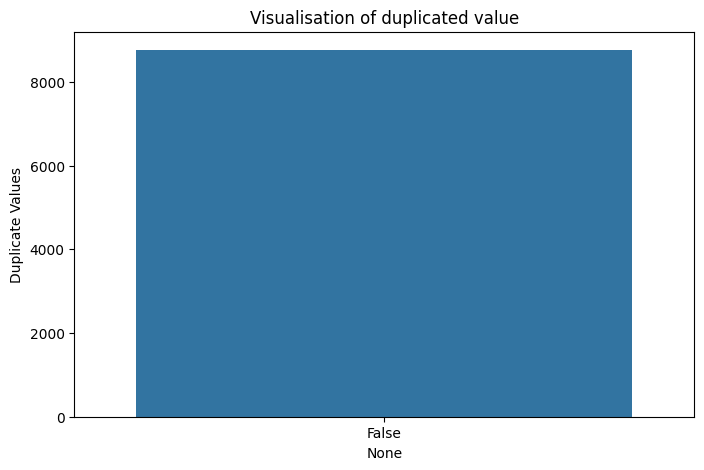

In [15]:
# Visualizing the duplicate values
plt.figure(figsize=(8,5))
#assigning the fig size to this countplot
#For better Well-structured and code formatted we will use (8,5) fig size to evry chart

sns.countplot(x=seol_bike_df.duplicated())
plt.title('Visualisation of duplicated value')
plt.ylabel('Duplicate Values')
plt.show()

### What did you know about your dataset?




1.   #### There are a total of 14 feature columns where Rented_Bike_Count is the dependent variable column.
2.   #### The total number of observations(rows) are 8760.
3. #### There are no duplicate rows in the dataset.
4. #### Also there are no missing values or Null values in the dataset.
5. #### Date- columns need to convert into proper data type.
6. #### Columns to convert into numeric(for modelling Purpose)
seasons
holiday
functioning day











## ***2. Understanding Your Variables***

In [16]:
# Dataset Columns
# Checking all the columns name
seol_bike_df.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [17]:
# Dataset Describe
seol_bike_df.describe(include='all')

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
count,8760,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760,8760,8760
unique,365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,2,2
top,30/11/2018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Spring,No Holiday,Yes
freq,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2208,8328,8465
mean,NaN,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,NaN,NaN,NaN
std,NaN,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,NaN,NaN,NaN
min,NaN,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,NaN,NaN,NaN
50%,NaN,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000,NaN,NaN,NaN
75%,NaN,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,NaN,NaN,NaN


### Variables Description

### <b> The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.</b>


<b>Attribute Information: </b>

* Date : year-month-day
* Rented Bike count - Count of bikes rented at each hour
* Hour - Hour of the day
* Temperature-Temperature in Celsius
* Humidity - %
* Windspeed - m/s
* Visibility - 10m
* Dew point temperature - Celsius
* Solar radiation - MJ/m2
* Rainfall - mm
* Snowfall - cm
* Seasons - Winter, Spring, Summer, Autumn
* Holiday - Holiday/No holiday
* Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)

### Check Unique Values for each variable.

In [18]:
# Check Unique Values for each variable.
seol_bike_df.nunique()

,0
Date,365
Rented Bike Count,2166
Hour,24
Temperature(°C),546
Humidity(%),90
Wind speed (m/s),65
Visibility (10m),1789
Dew point temperature(°C),556
Solar Radiation (MJ/m2),345
Rainfall(mm),61


## 3. ***Data Wrangling***

### Data Wrangling Code

In [19]:
# Before doing any data wrangling lets create copy of the dataset
data= seol_bike_df.copy()

In [20]:
# We can see that the Date variable is in object datatype, we need to change it into datetime datatype
data['Date'] = pd.to_datetime(data['Date'], format='%d/%m/%Y')

data['month'] = data['Date'].dt.month

data['day'] = data['Date'].dt.day_name()

In [21]:
# Dropping Date variable from dataset
data.drop(['Date'],axis = 1, inplace = True)

In [22]:
# Defining separate data as numerical and categorical data.
# Numerical data

numerical_data = list(set(data.describe().columns.tolist()) - {'Hour','month'})

# Categorical data

categorical_data = list(set(data.columns)-set(numerical_data))

#dependent variable Data
dependent_variable = ['Rented Bike Count']


In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 15 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Rented Bike Count          8760 non-null   int64  
 1   Hour                       8760 non-null   int64  
 2   Temperature(°C)            8760 non-null   float64
 3   Humidity(%)                8760 non-null   int64  
 4   Wind speed (m/s)           8760 non-null   float64
 5   Visibility (10m)           8760 non-null   int64  
 6   Dew point temperature(°C)  8760 non-null   float64
 7   Solar Radiation (MJ/m2)    8760 non-null   float64
 8   Rainfall(mm)               8760 non-null   float64
 9   Snowfall (cm)              8760 non-null   float64
 10  Seasons                    8760 non-null   object 
 11  Holiday                    8760 non-null   object 
 12  Functioning Day            8760 non-null   object 
 13  month                      8760 non-null   int32

In [24]:
data.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,month,day
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,Friday
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,Friday
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,12,Friday
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,Friday
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,Friday


### What all manipulations have you done and insights you found?

1) Changed Date column datatype from object to Datetime data type.

2) Created new columns Day and Month from date column and dropped Date.

3) Defining separate data as numerical and categorical data.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1
## Visualizing data distribution of Dependent variable (Rented Bike Count)

/tmp/ipython-input-3153137043.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['Rented Bike Count'] )


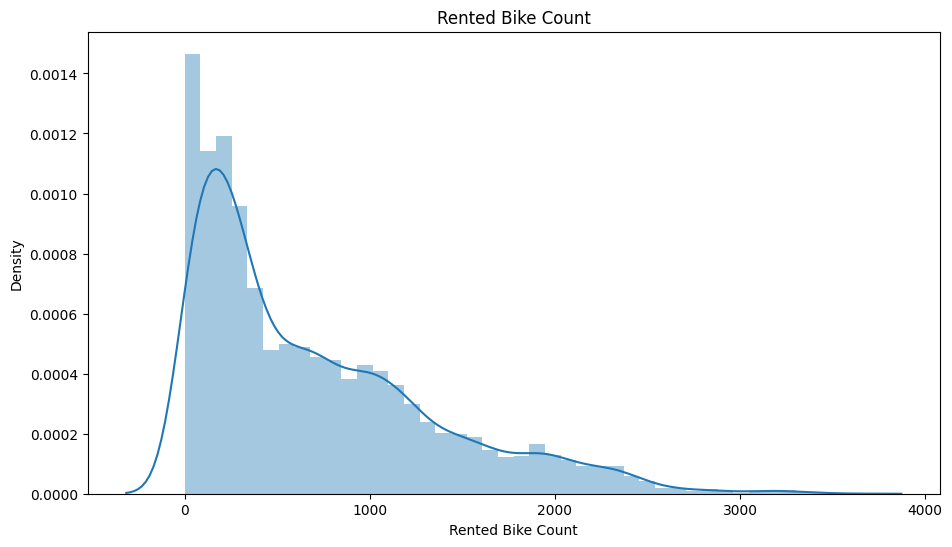

In [25]:
# Chart - 1 visualization code
# Chart - 1 visualization code

plt.figure(figsize=(11,6))
plt.title('Rented Bike Count')
sns.distplot(data['Rented Bike Count'] )
plt.show()

##### 1. Why did you pick the specific chart?

**Distplot is one of the best charts to show the data distribution.**

##### 2. What is/are the insight(s) found from the chart?

**From above distribution plot of dependent variable rented bike, we can clearly see that the distribution is positively skewed (Right skewed).It means that distribution is not symmetric around the the mean.**

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Yes, definately from this insight we got to know that our data is not normally distributed so, before doing or implementing any model on this data we need to normalise this data.**

#### Chart - 2
## Visualizing data distribution of categorical data with respect to Rented Bike Count.

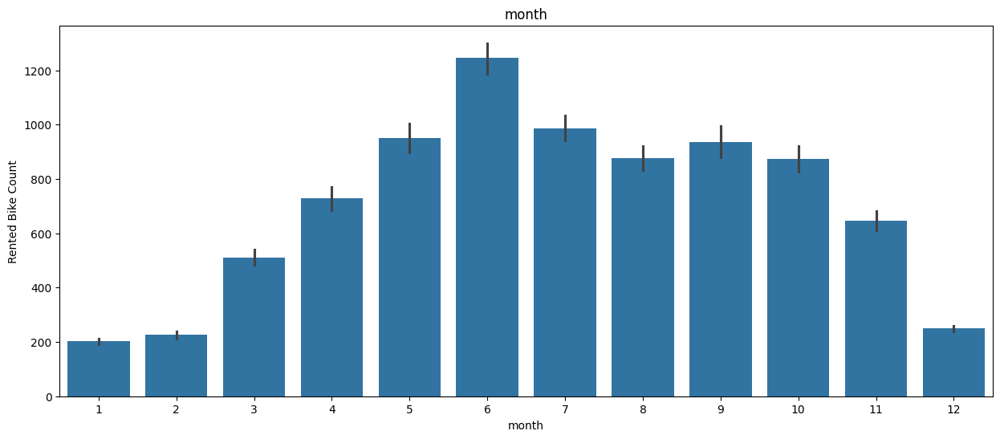

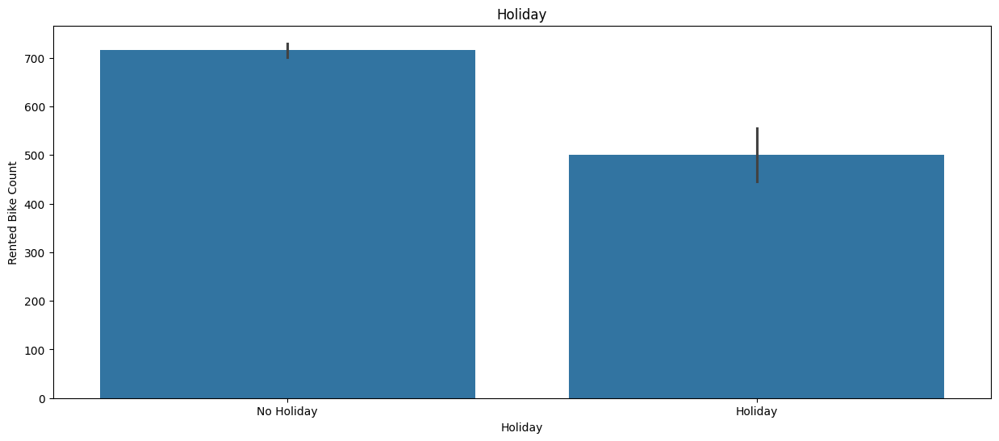

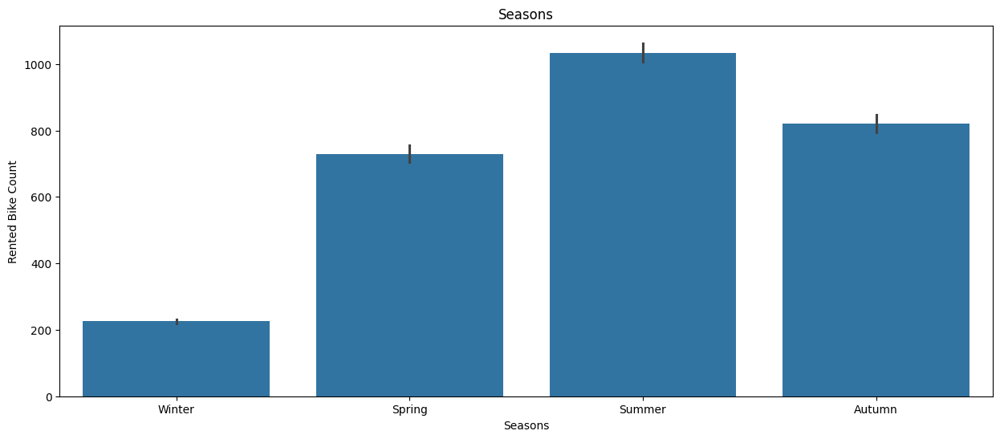

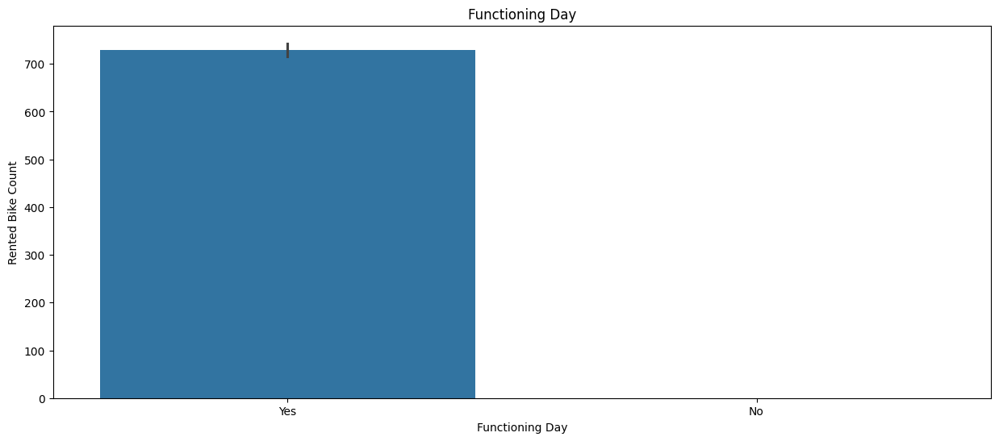

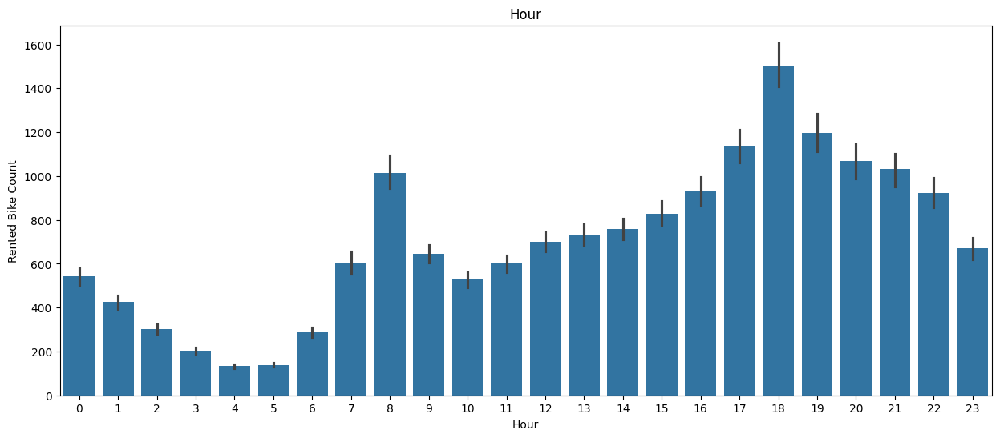

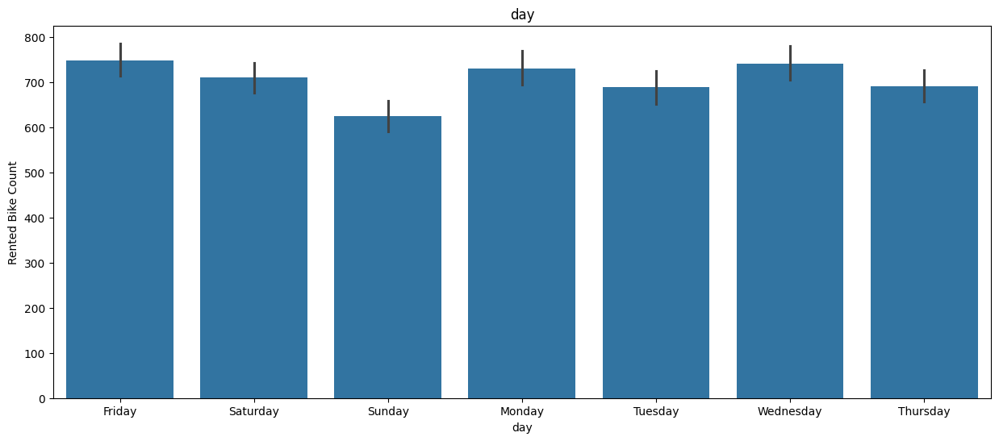

In [26]:
# Chart - 2 visualization code

# Creating a for loop for visualizing all the categorical data with respect to Rented Bike Count.

for i in categorical_data:
    plt.figure(figsize=(15,6))
    plt.title(i)
    sns.barplot(x = data[i], y = data['Rented Bike Count'])
    plt.show()

##### 1. Why did you pick the specific chart?

**To visualise and spread categorical data with respect to Rented Bike Count.**

##### 2. What is/are the insight(s) found from the chart?

1) The peak hours of rented bikes is 5:00PM - 7:00PM and the least bikes are rented between 3:00AM to 5:00AM.

2) June is the peak and January is the bottom months for number of rented bikes.

3) Highest no. of bikes are booked on Thursday and the least on Sunday.

4) People prefer renting bikes most in the Summer season and the least in winter season.

5) People rented more bikes on a non-holiday compared to a holiday.

6) On no functioning day no bikes were rented. we have only 295 counts of "NO". Thus we can drop that 295 values but column having only "Yes' will not add value to our column.So these columns is not use full for us. We will drop those in next steps.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**The above gained insights can definitely help creating a positive business impact, we got to know how time, month, day, season and holiday impact the number of rented bikes, we can make strategies accordingly.**


#### Chart - 3
##Bike Rent Count trend with respect to Hours on Months.(Multivariate analysis)


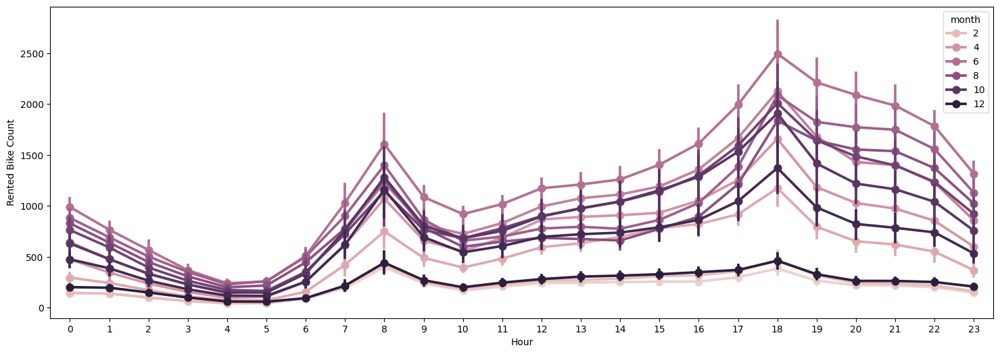

In [27]:
# Chart - 3 visualization code

# Using pointplot for multivariate analysis.

plt.figure(figsize = (18,6))
sns.pointplot(x = data['Hour'], y = data['Rented Bike Count'], hue = data['month'])
plt.show()

##### 1. Why did you pick the specific chart?

**To do a multivariate analysis among Hour, Rented Bike Count and Month**

##### 2. What is/are the insight(s) found from the chart?

**June is the peak and January is the bottom months for number of rented bikes.**

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**The above gained insights can definitely help creating a positive business impact, we got to know how month impact the number of rented bikes, we can make strategies accordingly.**

#### Chart - 4
## Bike Rent Count trend with respect Hours on Days. (multivariate)

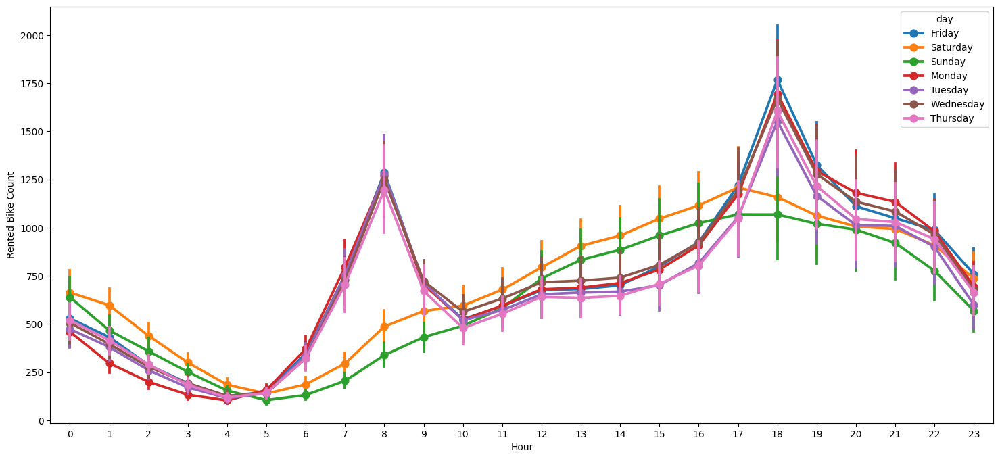

In [28]:
# Chart - 4 visualization code

# Using pointplot for multivariate analysis.

plt.figure(figsize = (18,8))
sns.pointplot(x = data['Hour'], y = data['Rented Bike Count'], hue = data['day'])
plt.show()

##### 1. Why did you pick the specific chart?

To do a multivariate analysis among Hour, Rented Bike Count and Day.

##### 2. What is/are the insight(s) found from the chart?

Highest no. of bikes are booked on Thursday and the least on Sunday.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The above gained insights can definitely help creating a positive business impact, we got to know how Days impact the number of rented bikes, we can make strategies accordingly.

#### Chart - 5
## Rented Bike Count vs Hour

Text(0.5, 1.0, 'Average bike rented per hour')

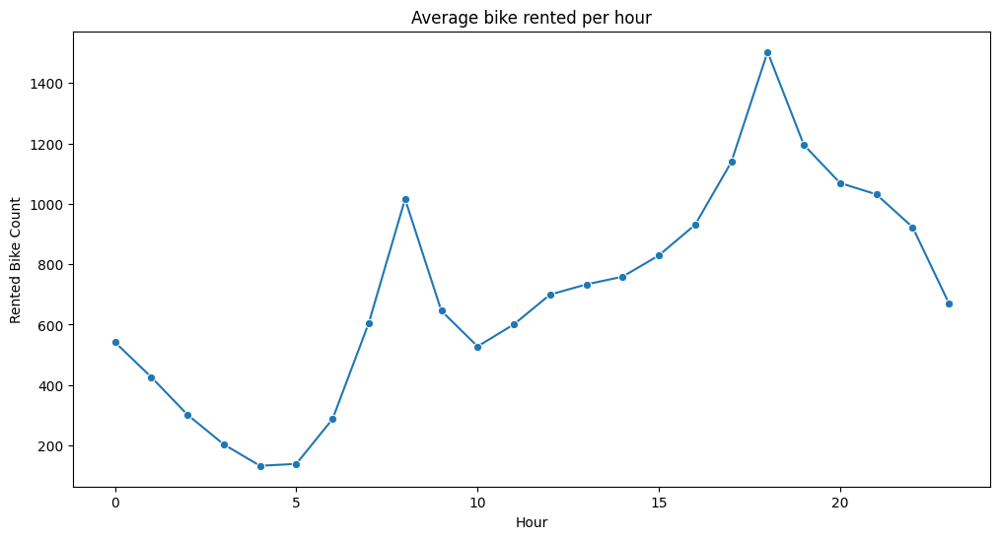

In [29]:
# Chart - 5 visualization code

#ploting line graph
#group by Hrs and get average Bikes rented, and precent change
avg_rent_hrs = data.groupby('Hour')['Rented Bike Count'].mean()
plt.figure(figsize=(12,6))
sns.lineplot(data=avg_rent_hrs, marker='o')
plt.title('Average bike rented per hour')

##### 1. Why did you pick the specific chart?

To see how rented bike demand is distributed over 24 hours time we used line plot.

##### 2. What is/are the insight(s) found from the chart?

From above line plot we can clearly see that there is high demand in the morning and in the evening.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, from above insight we know that there is high demand in morning and evening so business needs to focus more on that time slot. as well as try to meet the demand on that time slot.

#### Chart - 6
## Bike Rent Count trend with respect Hours on Seasons.(Multivariate analysis.)

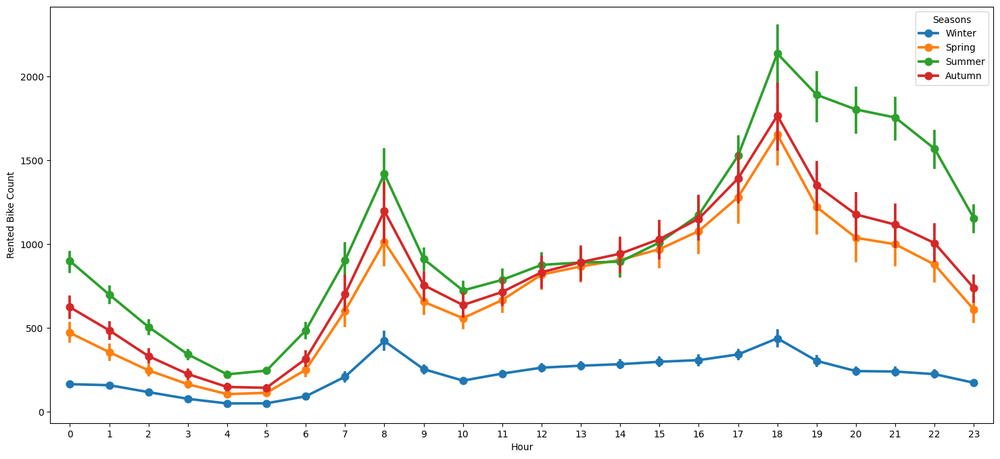

In [30]:
# Chart - 6 visualization code

# Using pointplot for multivariate analysis.

plt.figure(figsize = (18,8))
sns.pointplot(x = data['Hour'], y = data['Rented Bike Count'], hue = data['Seasons'])
plt.show()

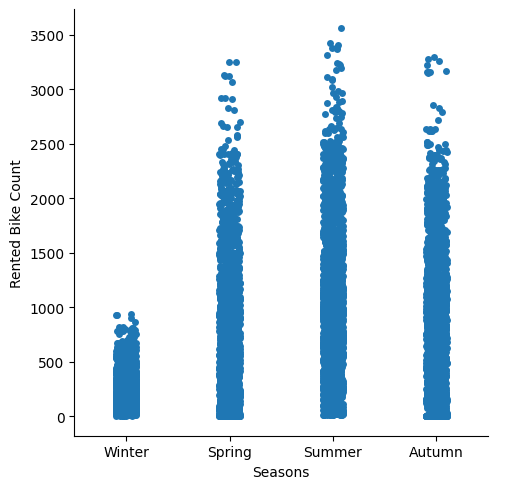

In [31]:
#plot for rented bike count seasonly

sns.catplot(x='Seasons',y='Rented Bike Count',data=data)

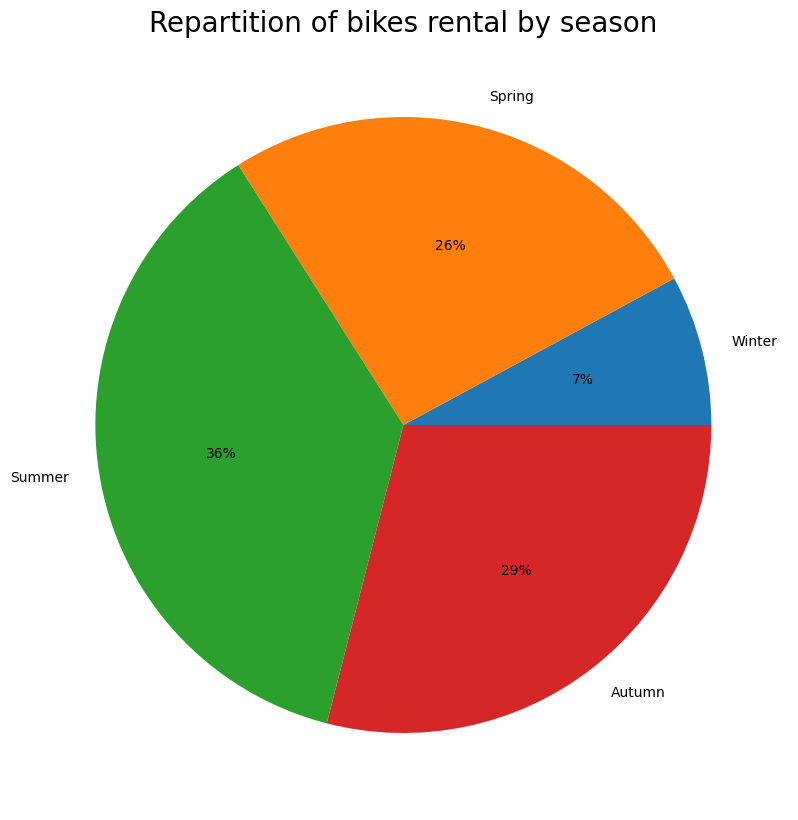

In [32]:
Winter=data[data["Seasons"]=='Winter'].sum()
Spring=data[data["Seasons"]=='Spring'].sum()
Summer=data[data["Seasons"]=='Summer'].sum()
Autumn=data[data["Seasons"]=='Autumn'].sum()

BikeSeasons={"Winter":Winter["Rented Bike Count"],"Spring":Spring["Rented Bike Count"],"Summer":Summer["Rented Bike Count"],"Autumn":Autumn["Rented Bike Count"]}
plt.gcf().set_size_inches(10,10)
plt.pie(BikeSeasons.values(),labels=BikeSeasons.keys(), autopct='%1d%%');
plt.title("Repartition of bikes rental by season", fontsize=20)
plt.show()

##### 1. Why did you pick the specific chart?

To do a multivariate analysis among Hour, Rented Bike Count and Months

##### 2. What is/are the insight(s) found from the chart?

People prefer renting bikes most in the Summer season and the least in winter season.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The above gained insights can definitely help creating a positive business impact, we got to know how Seasons impact the number of rented bikes, we can make strategies accordingly.

#### Chart - 7
## Bike Rent Count trend with respect Hours on Days.(Multivariate analysis)

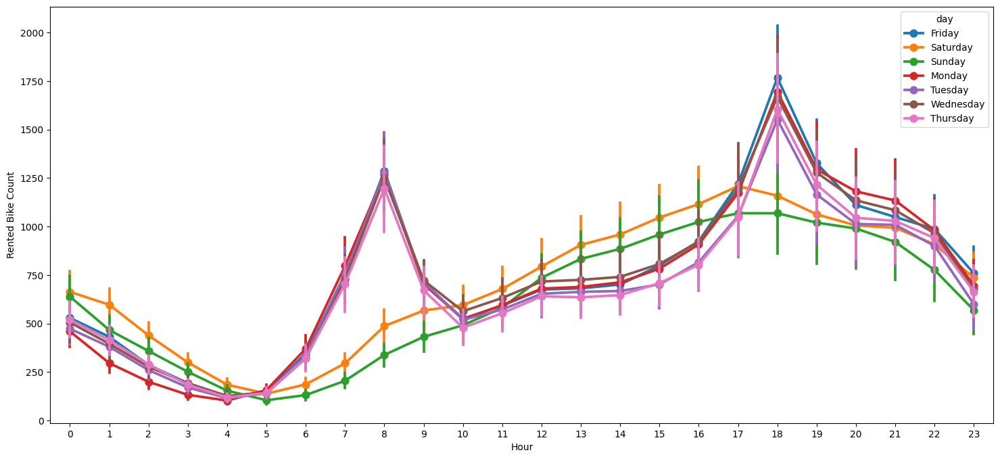

In [33]:
# Chart - 7 visualization code

# Using pointplot for multivariate analysis.

plt.figure(figsize = (18,8))
sns.pointplot(x = data['Hour'], y = data['Rented Bike Count'], hue = data['day'])
plt.show()

##### 1. Why did you pick the specific chart?

**To do a multivariate analysis among Hour, Rented Bike Count and Day.**

##### 2. What is/are the insight(s) found from the chart?

**Highest no. of bikes are booked on Thursday and the least on Sunday.**

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**The above gained insights can definitely help creating a positive business impact, we got to know how Days impact the number of rented bikes, we can make strategies accordingly.**

#### Chart - 8
## Bike Rent Count trend with respect Hours on Holidays.(multivariate analysis.)


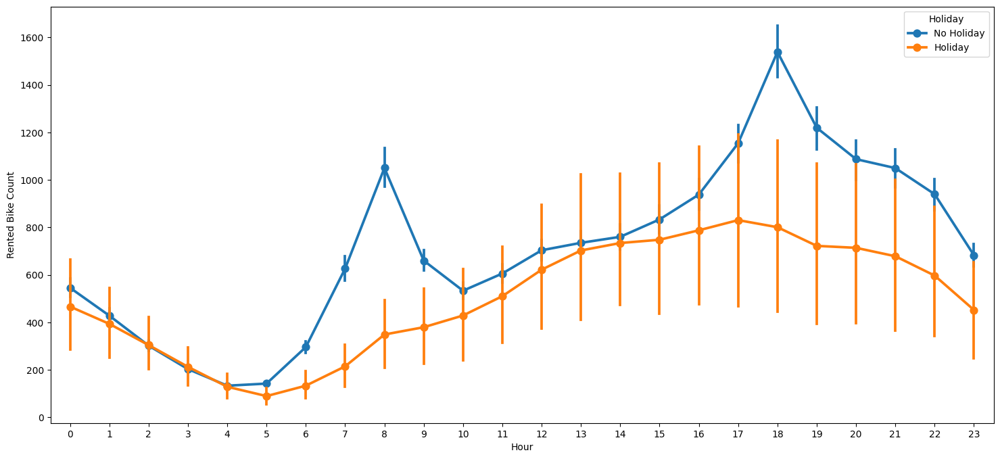

In [34]:
# Chart - 8 visualization code

# Using pointplot for multivariate analysis.

plt.figure(figsize = (18,8))
sns.pointplot(x = data['Hour'], y = data['Rented Bike Count'], hue = data['Holiday'])

plt.show()

##### 1. Why did you pick the specific chart?

To do a multivariate analysis among Hour, Rented Bike Count and Holiday.

##### 2. What is/are the insight(s) found from the chart?

People rented more bikes on a non-holiday compared to a holiday.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The above gained insights can definitely help creating a positive business impact, we got to know how Holidays impact the number of rented bikes, we can make strategies accordingly.

#### Chart - 9
## Visualizing outliers using box plot of numeric columns.

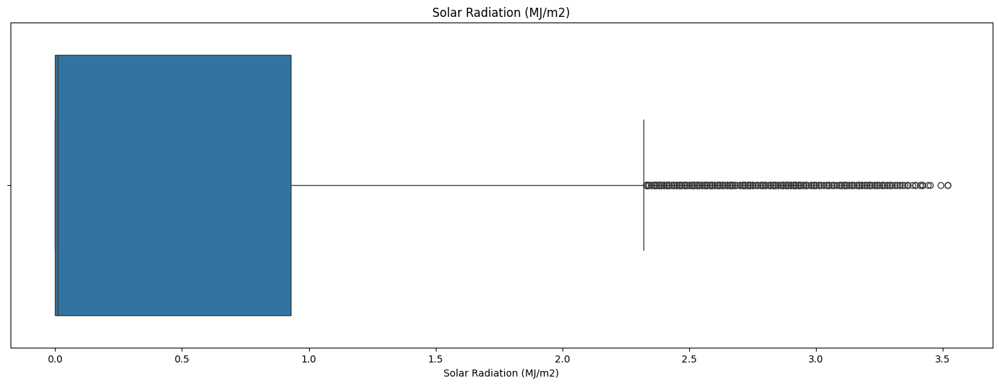

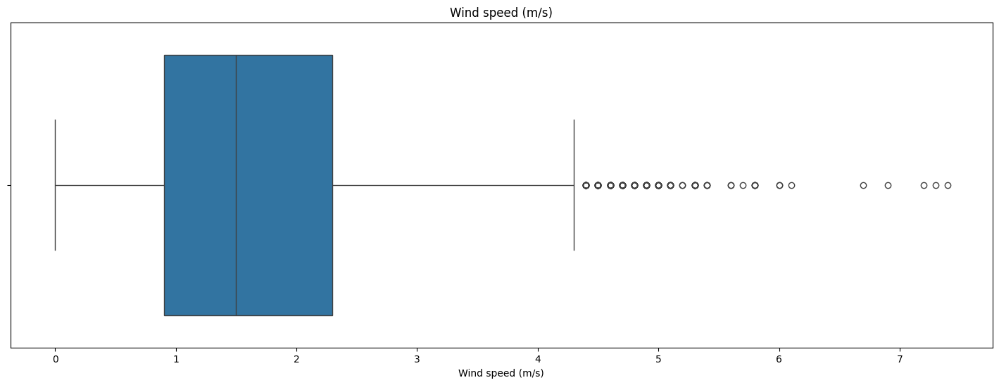

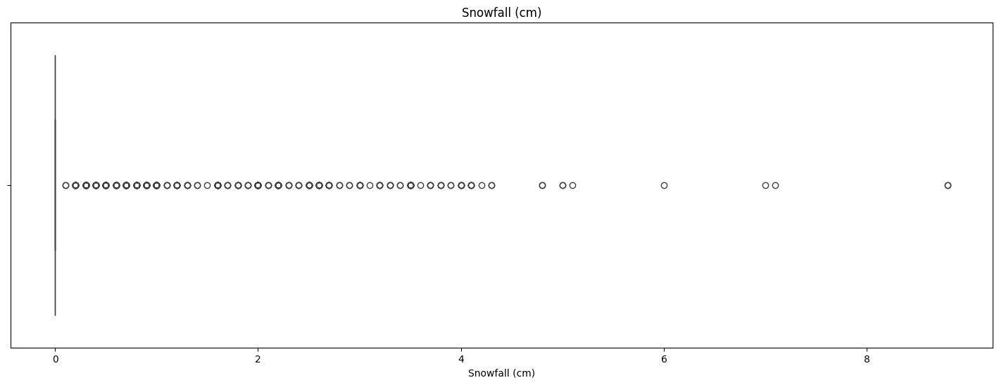

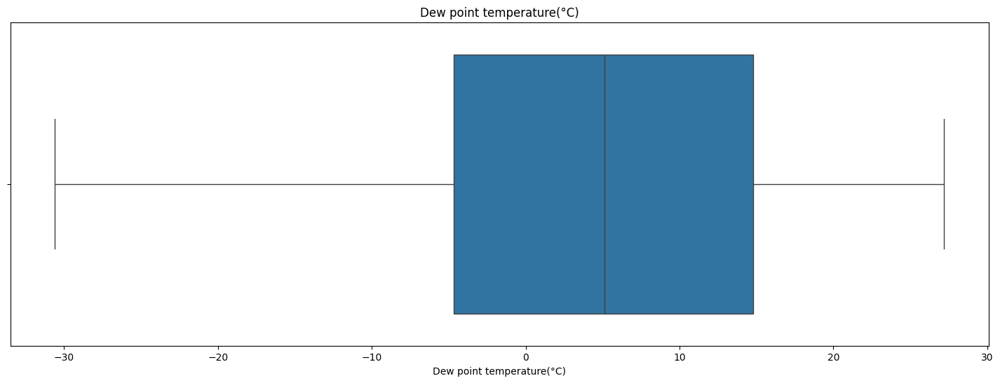

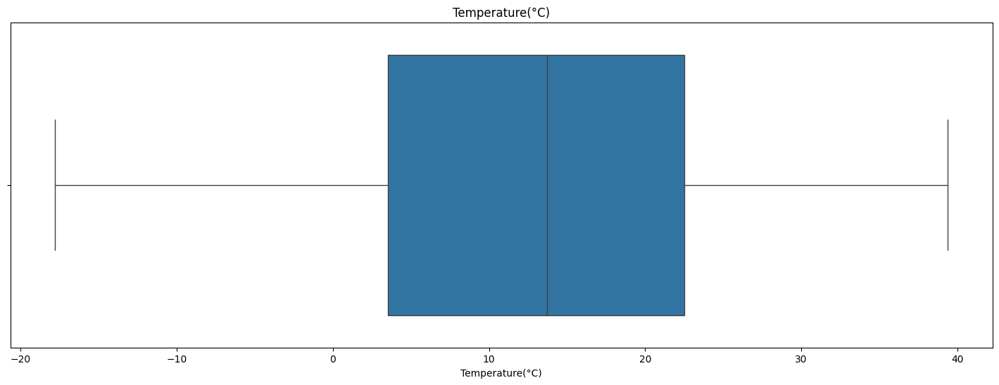

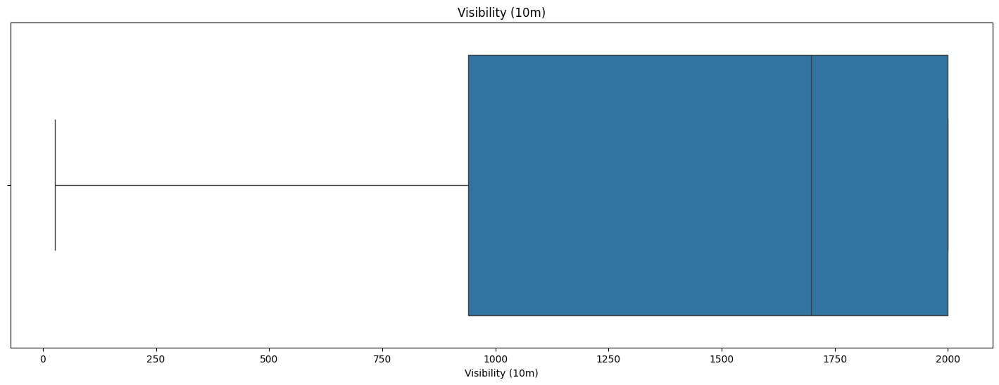

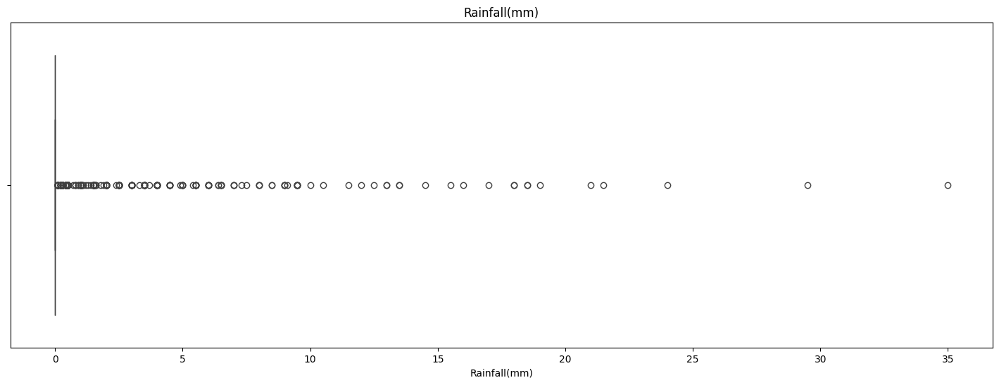

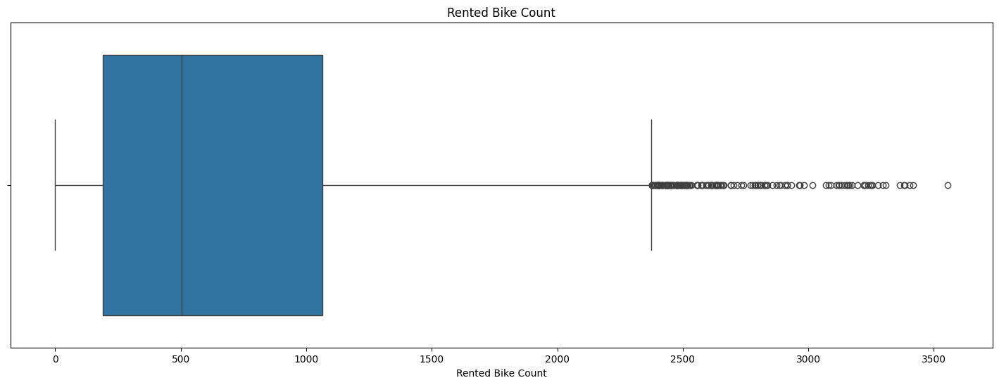

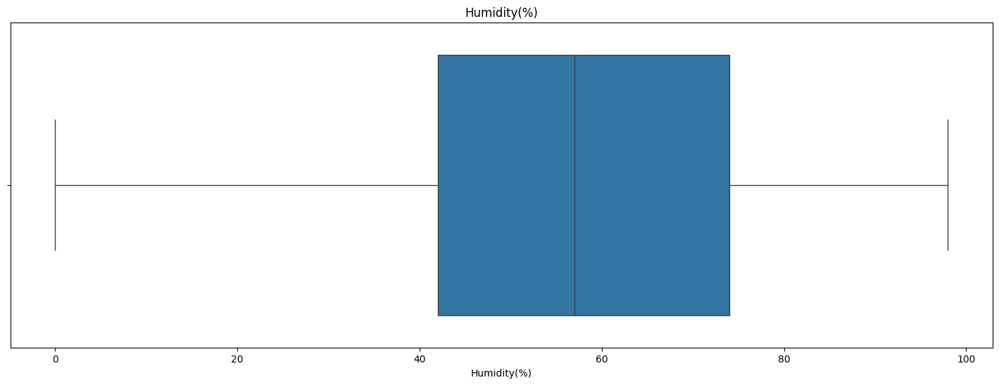

In [35]:
# Chart - 9 visualization code

# Writing code for creating a for loop for numerical variables and creting box plots.

for i in numerical_data:
  plt.figure(figsize = (18,6))
  sns.boxplot(x = data[i])
  plt.title(i)
  plt.show()

##### 1. Why did you pick the specific chart?

Using Boxplots as we need to identify outliers.

##### 2. What is/are the insight(s) found from the chart?

Rainfall, Solar Radiation, Snowfall and Windspeed has high numbers of outliers.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

In some cases, outliers may represent opportunities for business growth. For example, if there are a small number of customers who are making a significantly higher number of bike rentals than the average customer, this may represent a market segment that can be targeted for special promotions or marketing campaigns.

#### Chart - 10
##Linear relationship between the dependent variable-"Rented Bike Count' and remaining Independent variables.

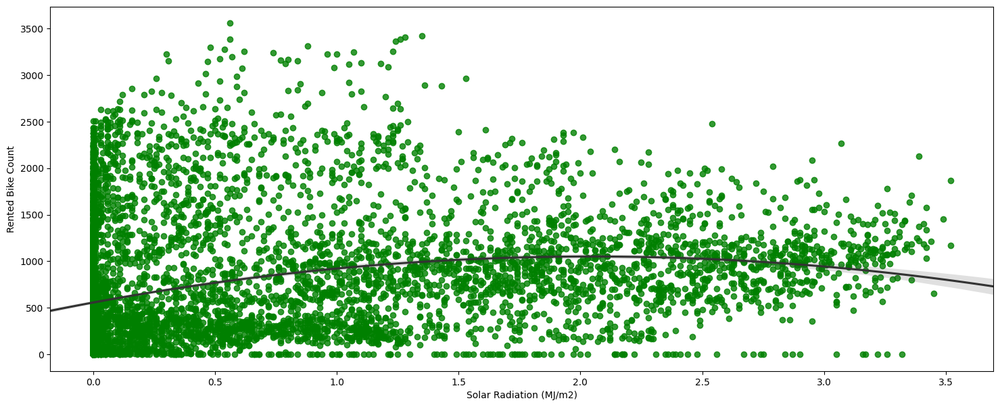

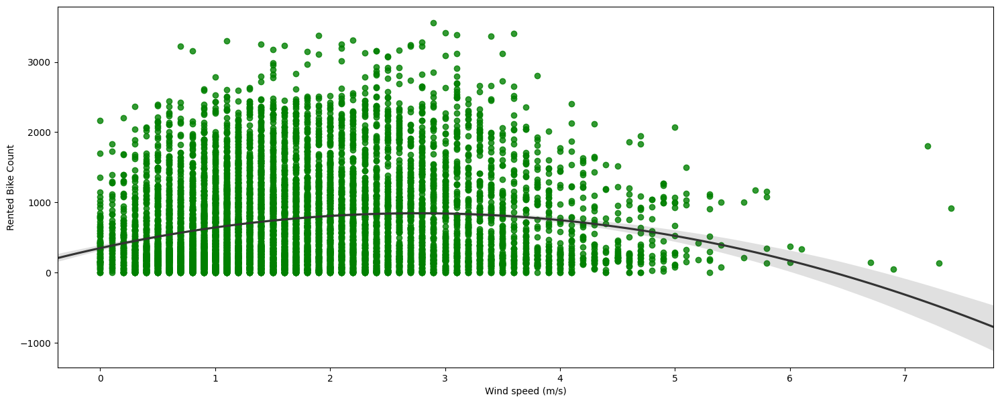

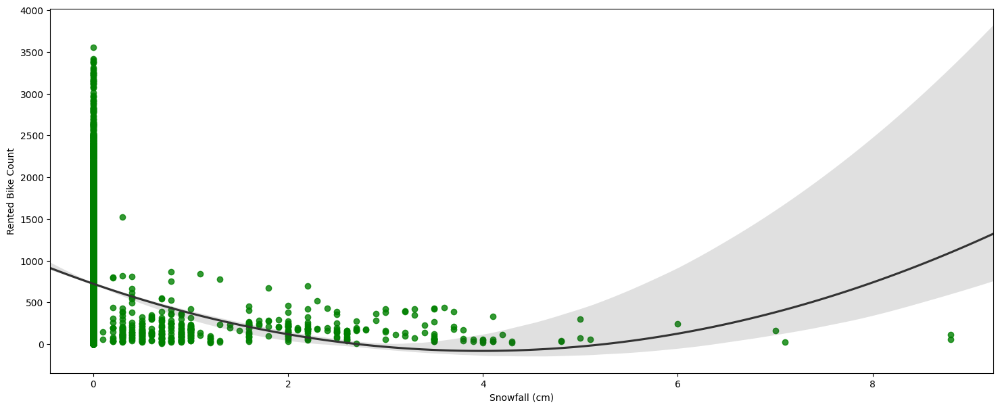

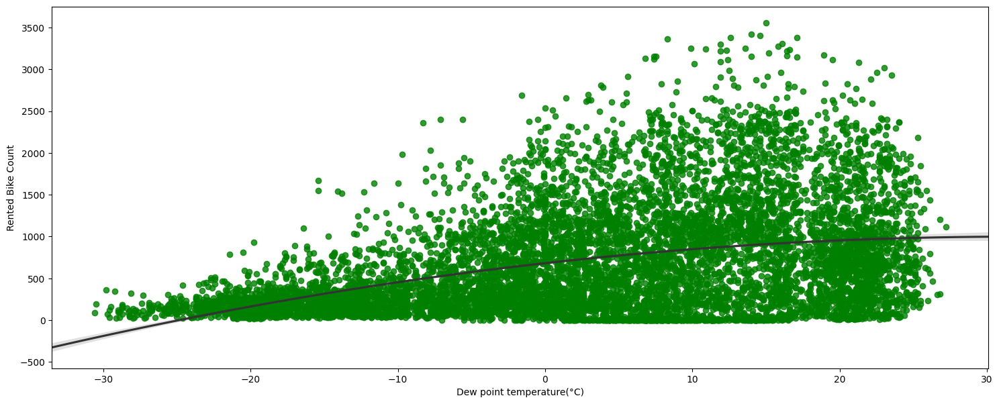

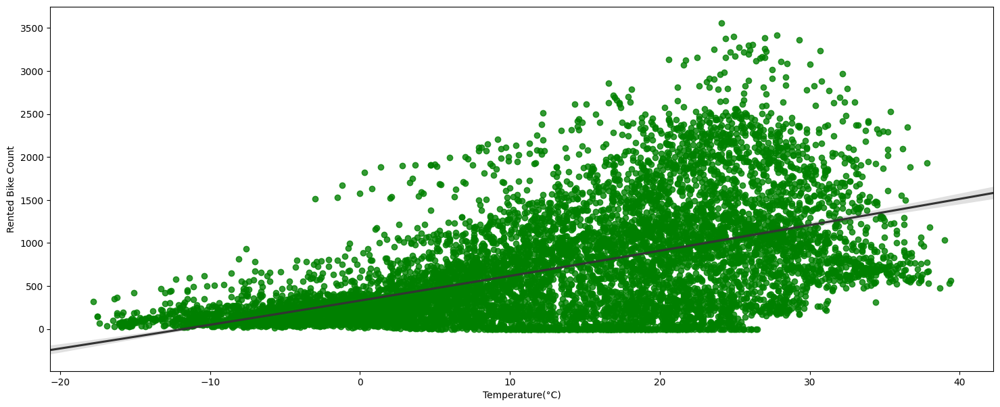

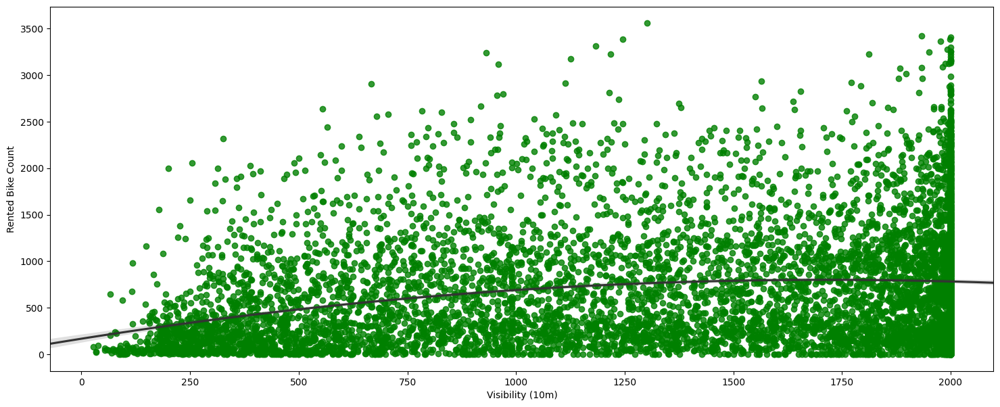

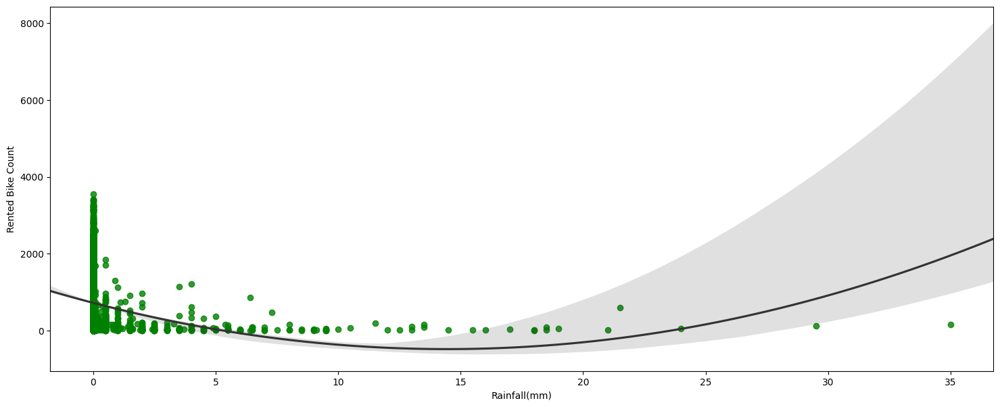

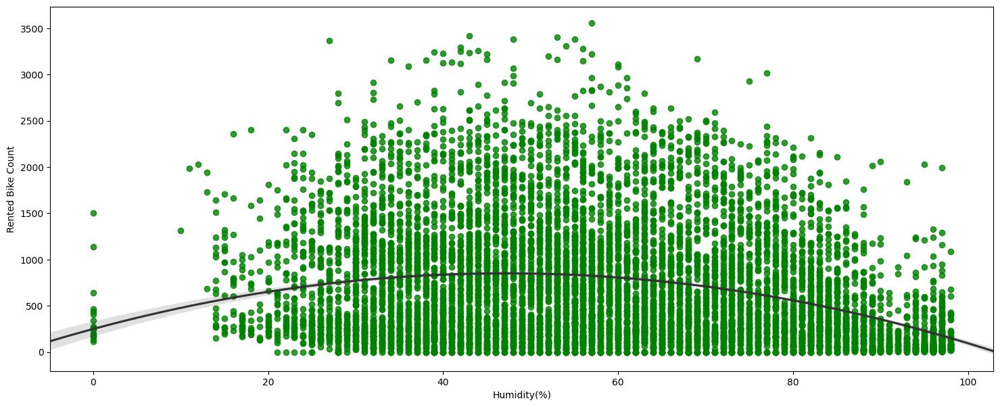

In [36]:
# Chart - 10 visualization code

#visualization code using regplot.

for i in numerical_data:
  if i not in ['Rented Bike Count']:
    fig = plt.figure(figsize = (18,7))
    fig = plt.gca()

    sns.regplot(
        data=data, x=i, y="Rented Bike Count",
        truncate=False, order=2, color=".2",scatter_kws={'color':'green'}
    )
    plt.show()

##### 1. Why did you pick the specific chart?

I used regplot as it allows us to quickly visualize the relationship between two variables and determine whether there is a linear or non-linear relationship between them.

##### 2. What is/are the insight(s) found from the chart?

**Hour:**

1)There is sudden peak between 6/7AM to 10 AM. Office time,College and going time could be the reason for this sudden peak.

2) Again there is peak between 10 AM to 7 PM. may be its office leaving time for the above people.

3) We can say that,from morning 7 AM to Evening 7 PM we have good Bike Rent Count. and from 7 PM to 7 AM Bike Rent count starts declining.

**Temperature :**

1) For decrease in temperature below 0 deg celicus the bike rent count is significantly decreased because may be people dont want to ride bike in such
cold temperature.

2) But for normal temperature the Bike rent count is very high.

**humidity:**

1) Here its seems like humidty is inversely proportional to bike rent count. As humdity percentage is increasing there is decrease in bike rent count.

**Wind Speed:**

1) upto wind speed 4 m/s there is good bike rent count.

**Visibility:**
1) It's very obivious that as visibilty increases the bike rent count also increases. Nobody would prefere to ride in low visibilty.

**Dew Point Temperature:**

1)It's again the same case as of temperature. As dew temperature goes below 0 deg celcius there is less bike rent count. It looks like Dew Point temperature and Temperature columns have strong colinarity.

**Solar radiation:**
1)Here the amount of rented bikes is huge, when there is solar radiation.

**Rainfall And snowfall:**
1) Its very obivious that people usually do not like ride bikes in rain and snowfall.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The above gained insights can definitely help creating a positive business impact, we got to know how the variables impact the number of rented bikes, we can make strategies accordingly.

#### Chart - 11

## Visualizing the data distribution on the dependent variable before normalization.



/tmp/ipython-input-4178277257.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=(data['Rented Bike Count']),color='b',ax=axes[0])


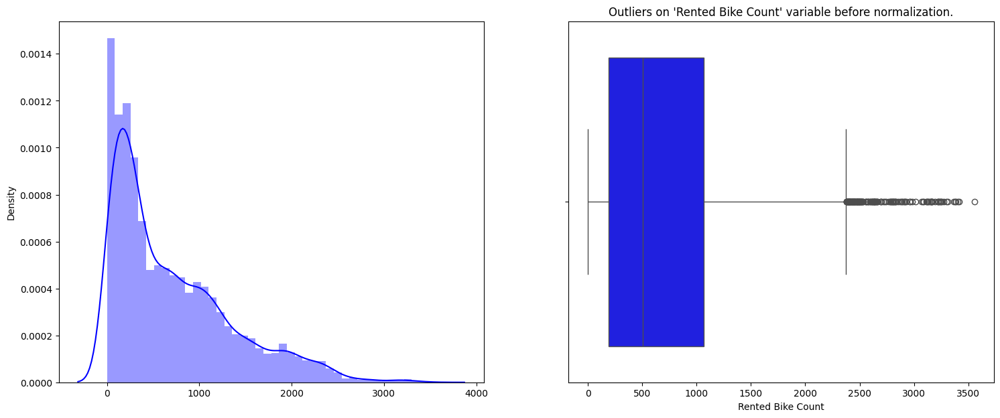

In [37]:
# Chart - 11 visualization code

# Visualizing the data distribution on the dependent variable using distplot and boxplot charts.

f, axes = plt.subplots(1, 2,figsize=(18,7))
sns.distplot(x=(data['Rented Bike Count']),color='b',ax=axes[0])
sns.boxplot(x=(data['Rented Bike Count']),color='b',ax=axes[1])
plt.title("Outliers on 'Rented Bike Count' variable before normalization.")
plt.show()

## Visualizing the data distribution on the dependent variable after normalization.

/tmp/ipython-input-4101033446.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=np.sqrt(data['Rented Bike Count']),color='g',ax=axes[0])


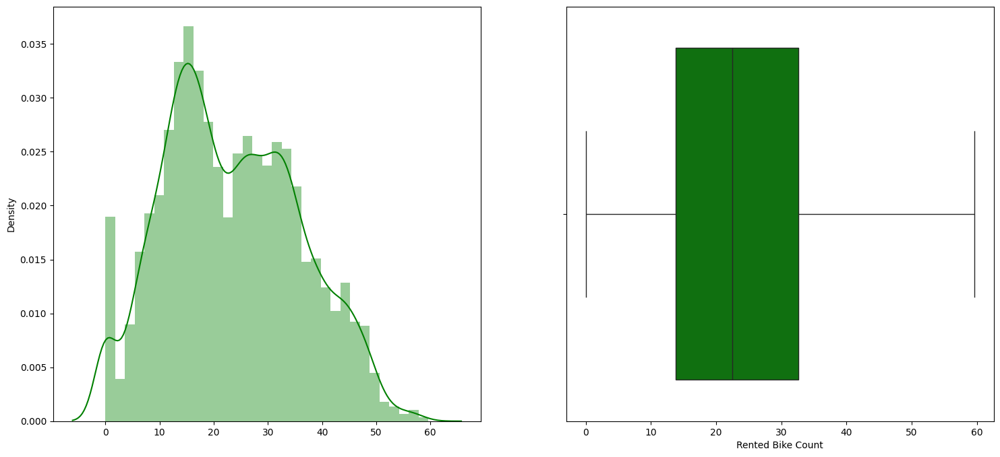

In [38]:
# Normalizing  our target variable by squre root method

f, axes = plt.subplots(1, 2,figsize=(18,8))
sns.distplot(x=np.sqrt(data['Rented Bike Count']),color='g',ax=axes[0])
sns.boxplot(x=np.sqrt(data['Rented Bike Count']),color='g',ax=axes[1])
plt.show()

##### 1. Why did you pick the specific chart?

Used distplot to visualize the distribution of data and using boxplot to detect outliers.

##### 2. What is/are the insight(s) found from the chart?

As we can see from both the charts the distribution of the data is less skewed and is moving towards normally distributed data

The outliers are also gone after normalization.





##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Improved accuracy, comparability and better visualization are the result of normalization which can improve model performance.


#### Chart - 12

##Visualizing the numerical before and after square root normalization.

/tmp/ipython-input-1320373293.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data[i] )


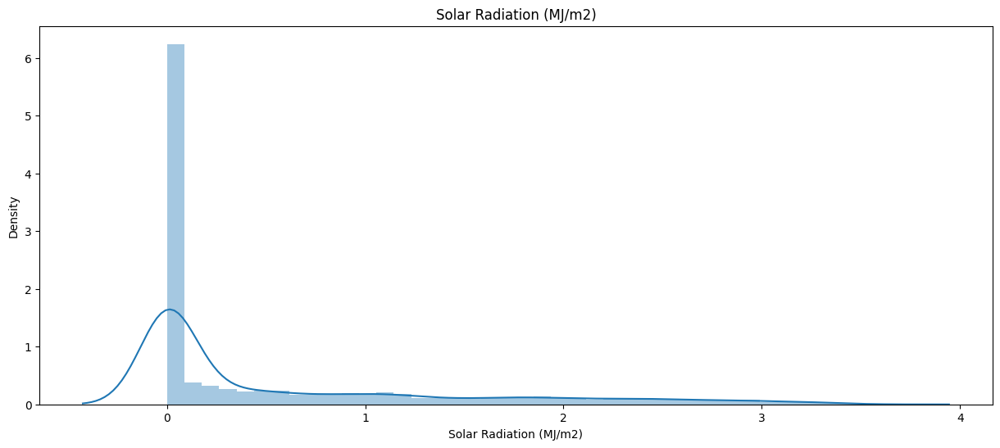

/tmp/ipython-input-1320373293.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data[i] )


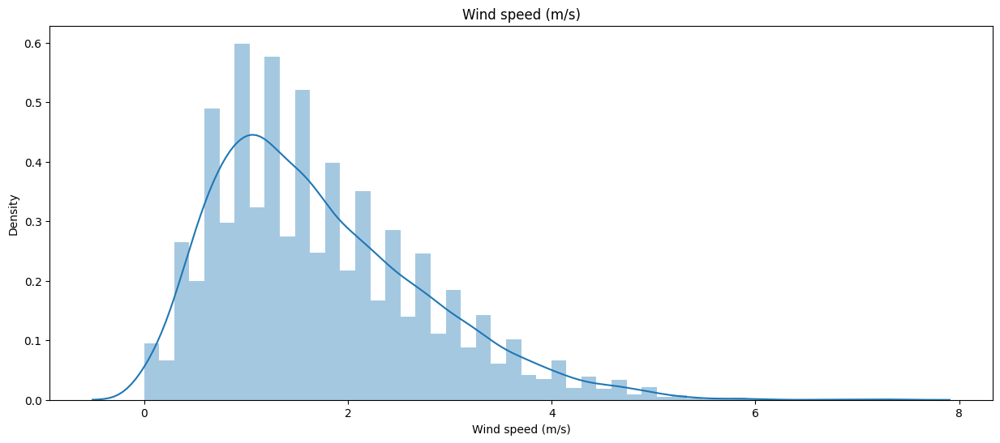

/tmp/ipython-input-1320373293.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data[i] )


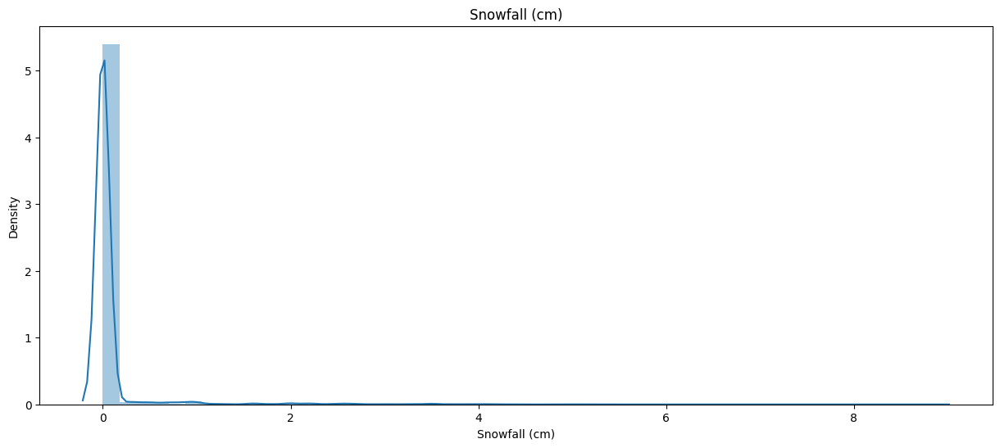

/tmp/ipython-input-1320373293.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data[i] )


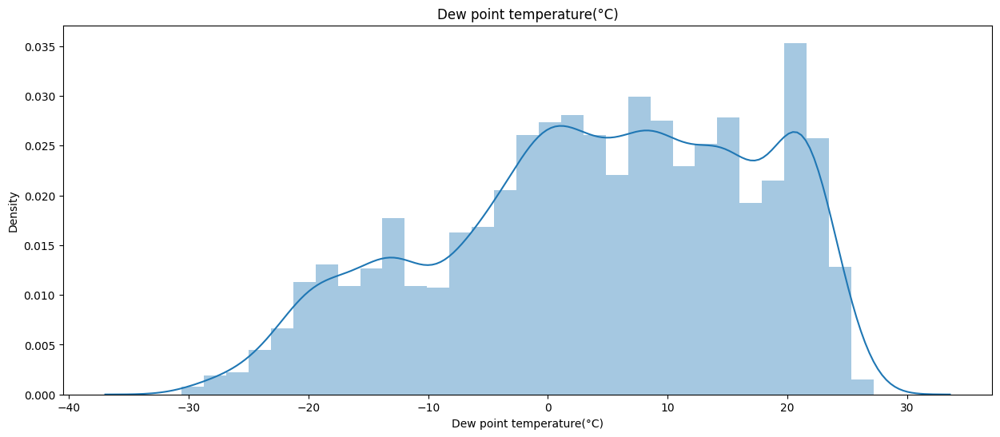

/tmp/ipython-input-1320373293.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data[i] )


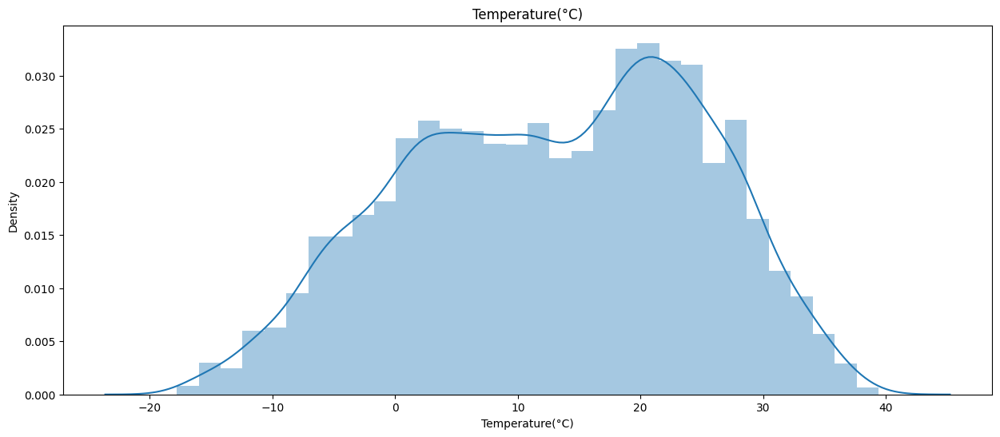

/tmp/ipython-input-1320373293.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data[i] )


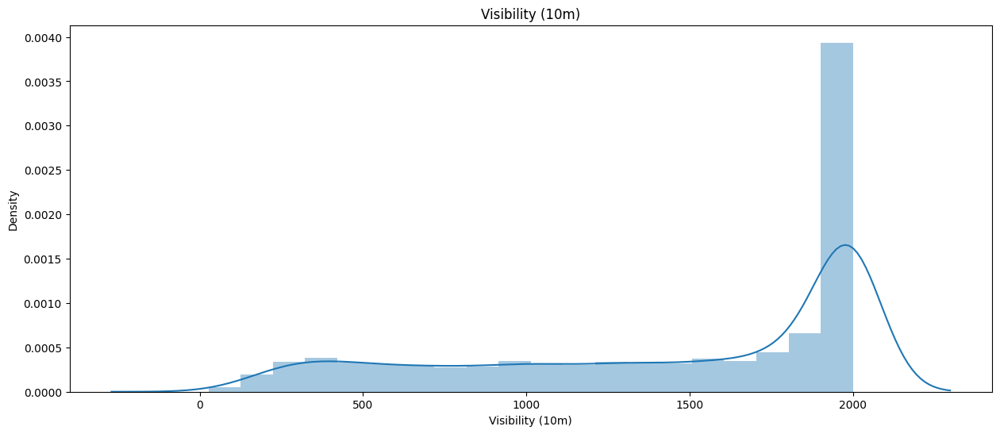

/tmp/ipython-input-1320373293.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data[i] )


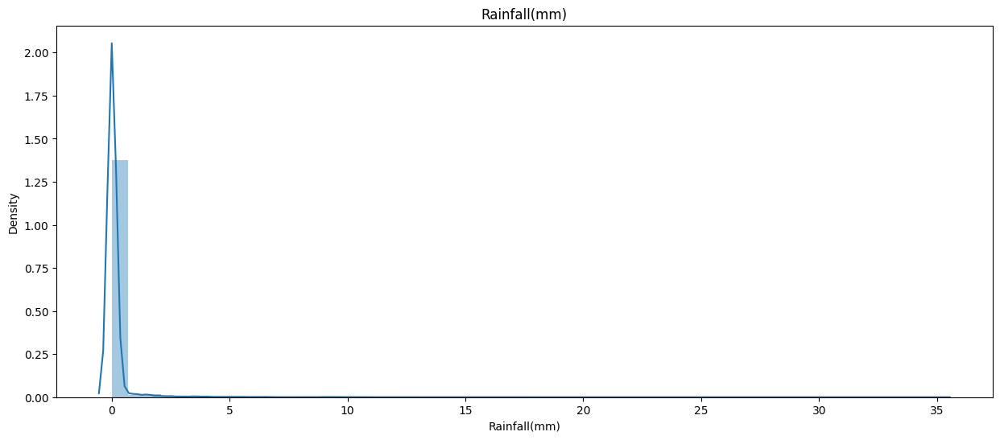

/tmp/ipython-input-1320373293.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data[i] )


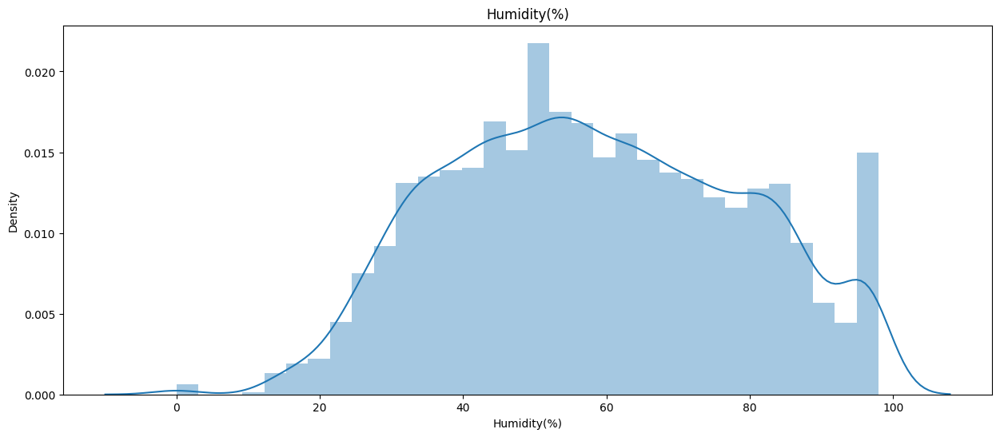

In [39]:
# Chart - 12 visualization code
# Creating a for loop for visualizing all the numerical variables using distplot.

for i in numerical_data:
  if i not in ['Rented Bike Count']:
    plt.figure(figsize=(15,6))
    plt.title(i)
    sns.distplot(data[i] )
    plt.show()


/tmp/ipython-input-627253450.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.sqrt(data[i]), color = 'g' )


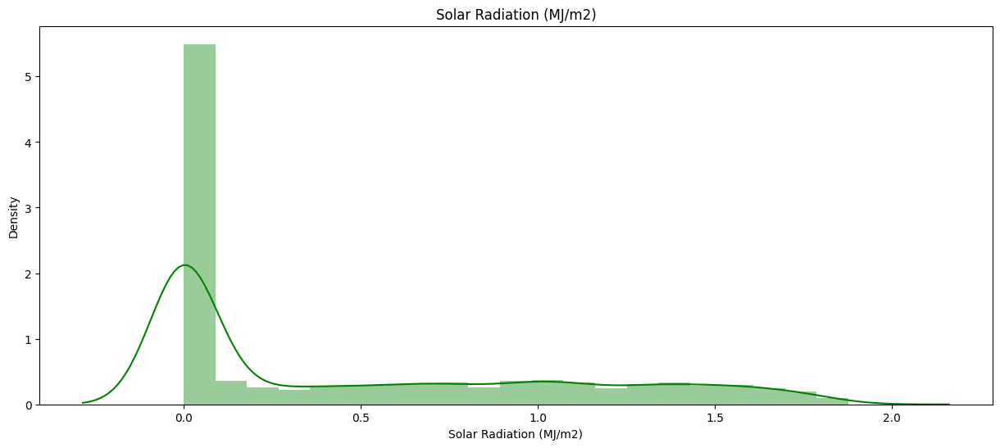

/tmp/ipython-input-627253450.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.sqrt(data[i]), color = 'g' )


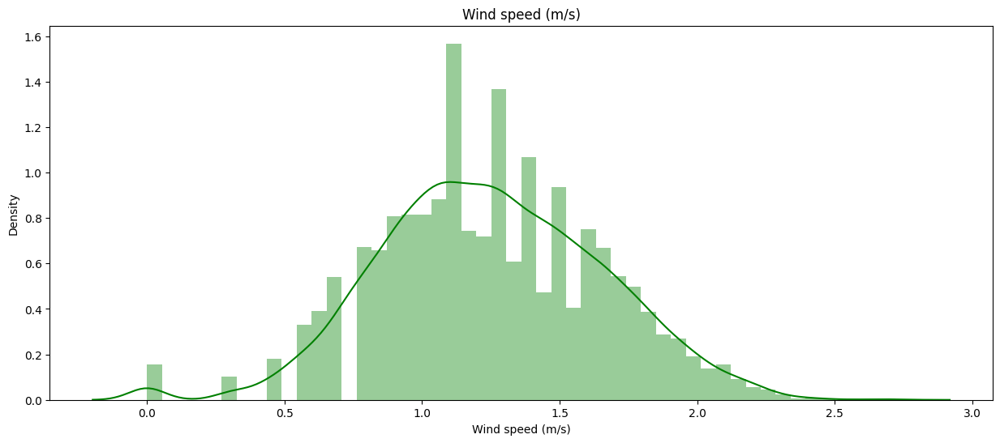

/tmp/ipython-input-627253450.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.sqrt(data[i]), color = 'g' )


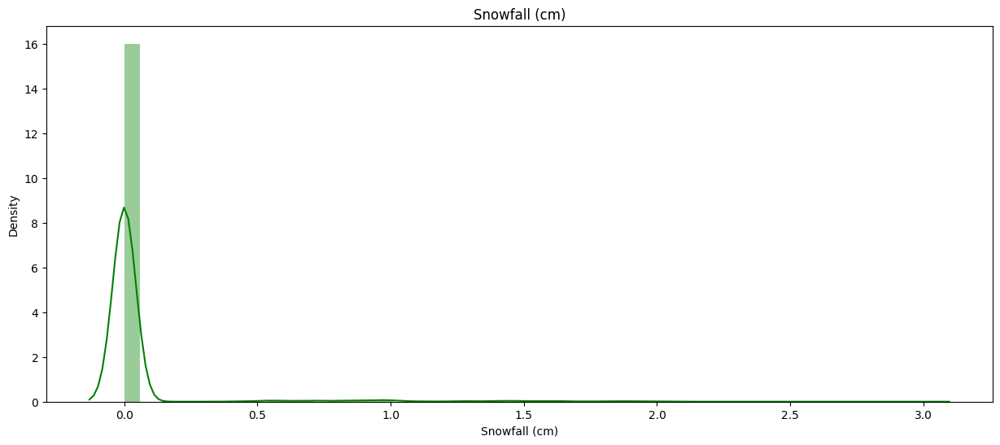

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipython-input-627253450.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.sqrt(data[i]), color = 'g' )


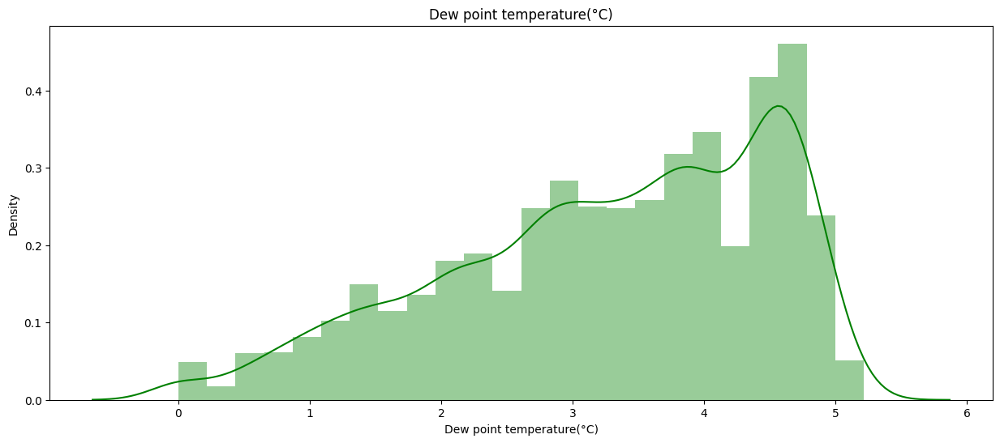

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipython-input-627253450.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.sqrt(data[i]), color = 'g' )


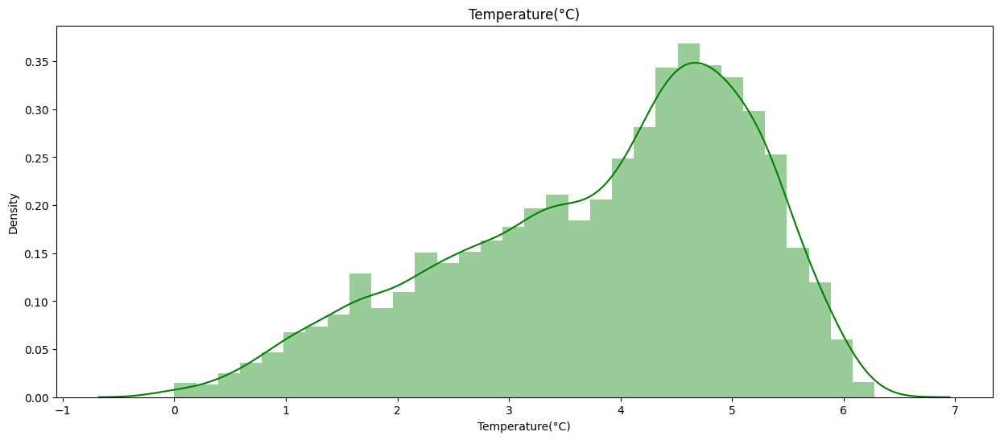

/tmp/ipython-input-627253450.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.sqrt(data[i]), color = 'g' )


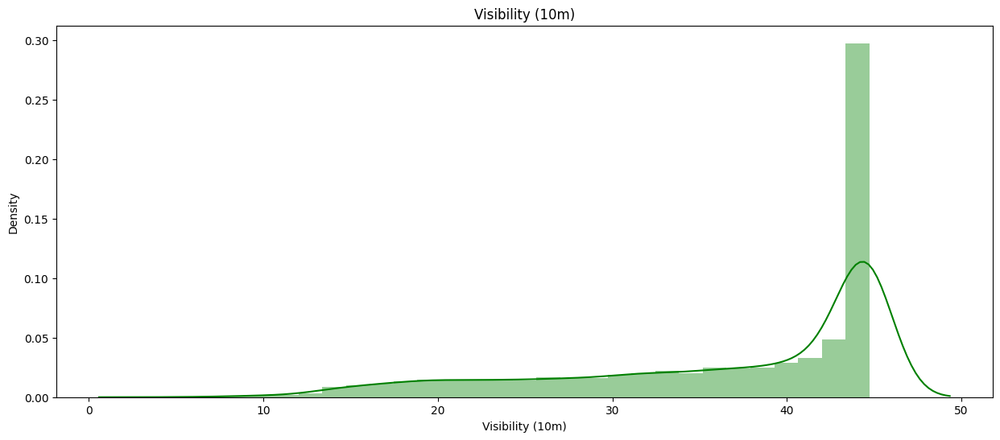

/tmp/ipython-input-627253450.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.sqrt(data[i]), color = 'g' )


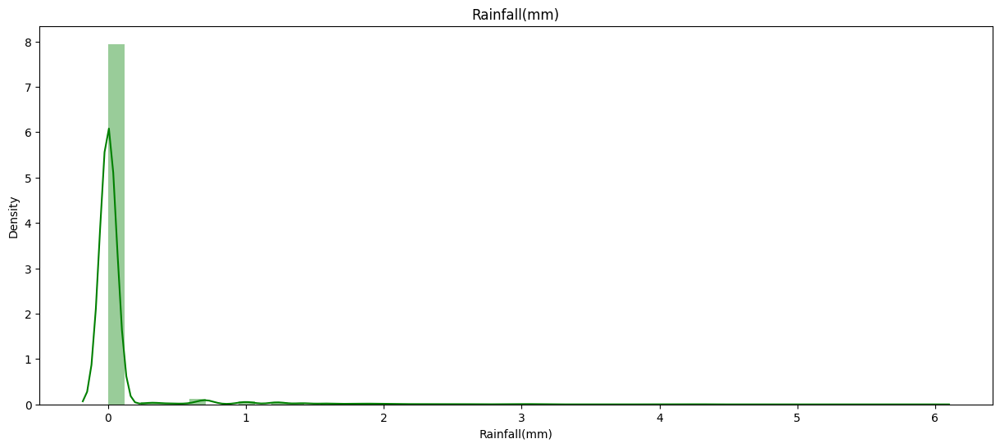

/tmp/ipython-input-627253450.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.sqrt(data[i]), color = 'g' )


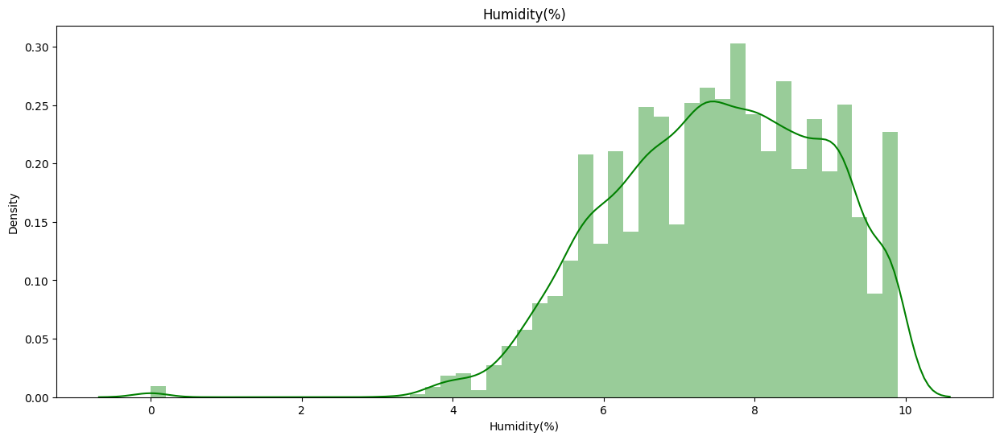

In [40]:
# visualization code with distplot after normalising.
for i in numerical_data:
  if i not in ['Rented Bike Count']:
    plt.figure(figsize=(15,6))
    plt.title(i)
    sns.distplot(np.sqrt(data[i]), color = 'g' )
    plt.show()

##### 1. Why did you pick the specific chart?

Distplot is one of the best charts to show the data distribution.

##### 2. What is/are the insight(s) found from the chart?

Distribution of Wind speed, Dew point temperature, Temperature and Humidity has improved.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Improved accuracy, comparability and better visualization are the result of normalization which can improve model performance.


#### Chart - 13
##Checking distribution of numerical data with mean and median after normalization.

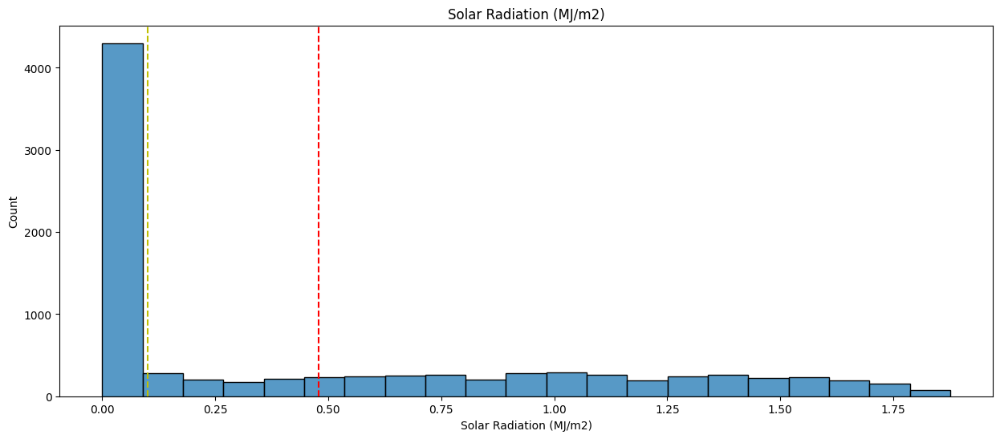

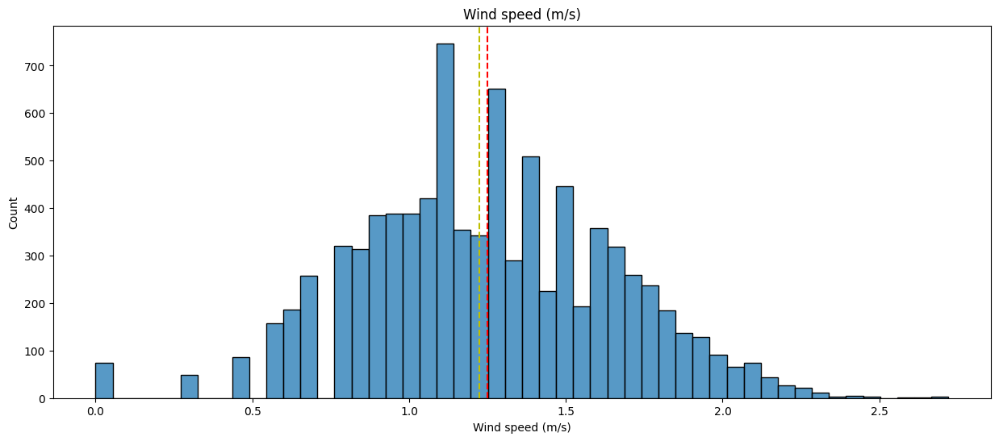

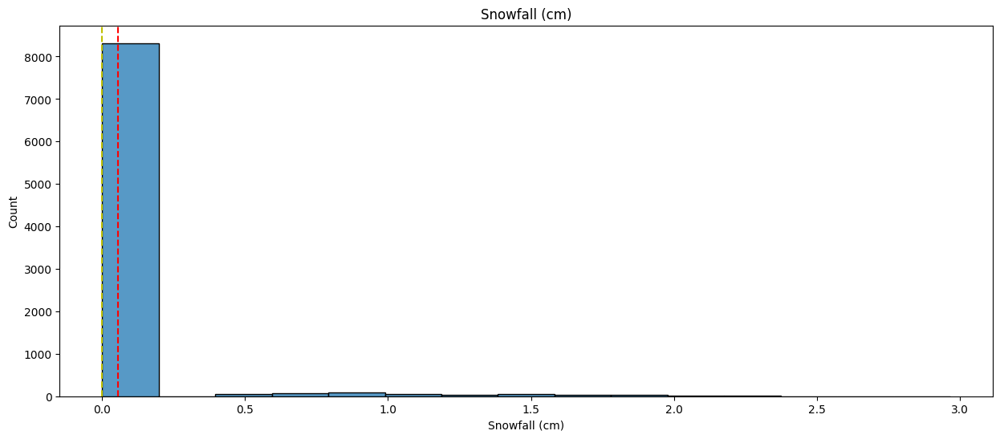

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


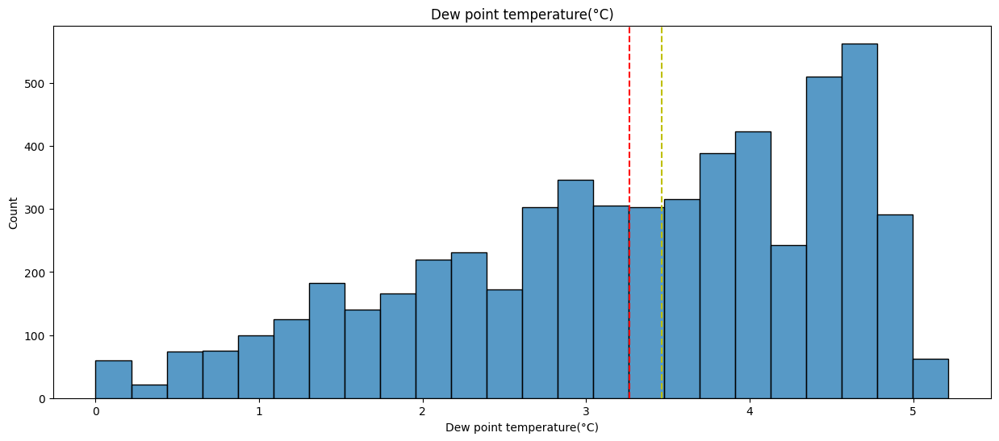

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


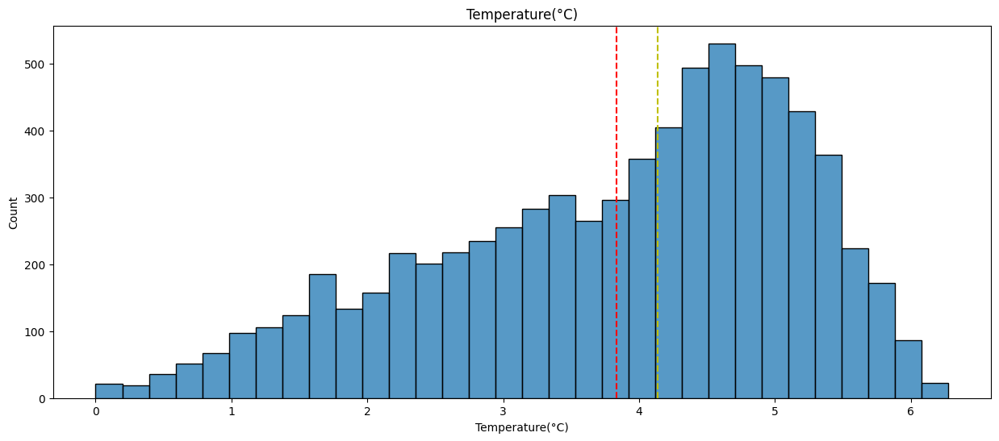

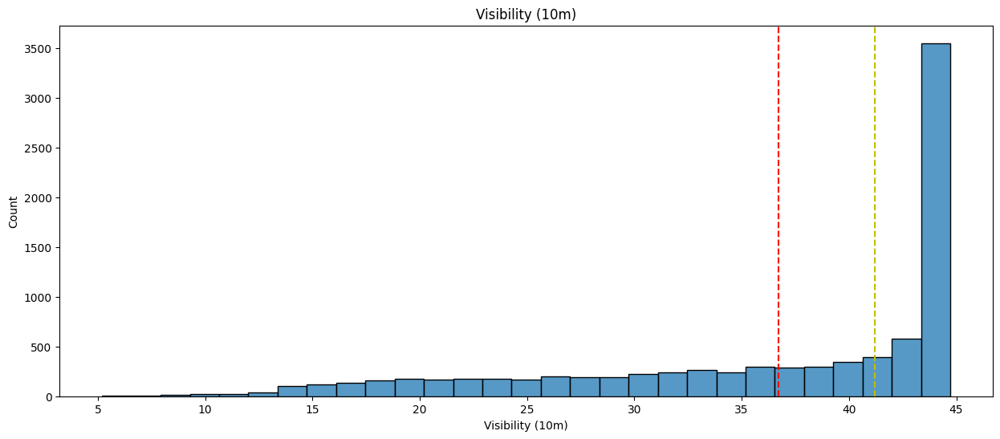

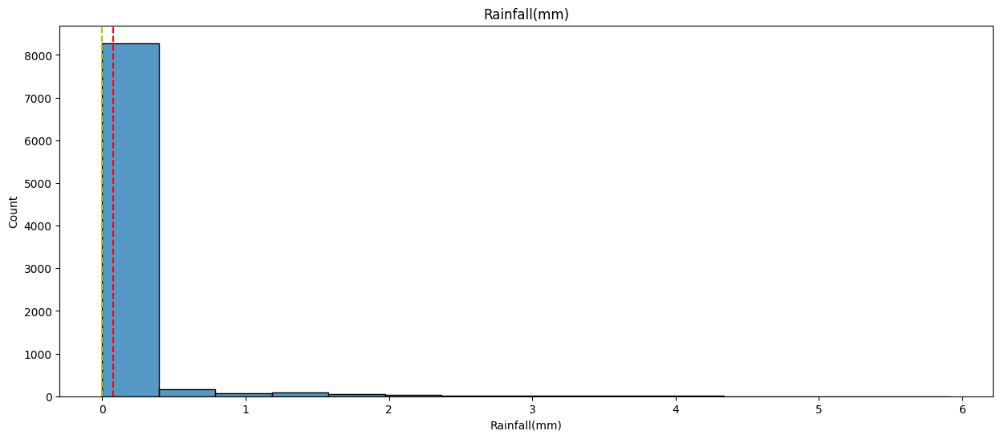

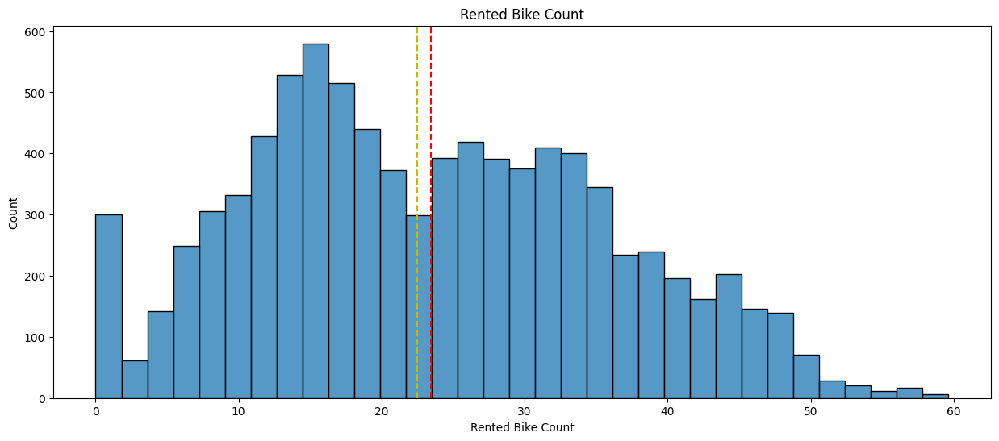

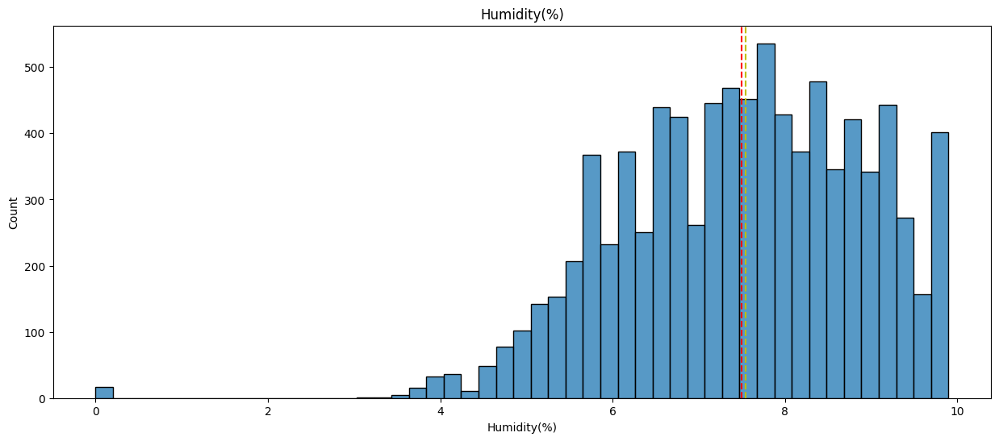

In [41]:
# Chart - 13 visualization code
# Visualizing the distribution of numerical data with mean and median using histplot.

for i in numerical_data:
  fig = plt.figure(figsize = (15,6))
  sns.histplot(np.sqrt(data[i]))
  plt.axvline(np.sqrt(data[i]).mean(), linestyle = '--', color = 'r')
  plt.axvline(np.sqrt(data[i]).median(), linestyle = '--', color = 'y')
  plt.title(i)
  plt.show()

##### 1. Why did you pick the specific chart?

Histplot is one of the best charts to show the data distribution.

##### 2. What is/are the insight(s) found from the chart?

Solar radiation, Snowfall, Rainfall and visibility are still skewed but Distribution of Wind speed, Dew point temperature, Temperature and Humidity has improved.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Improved accuracy, comparability and better visualization are the result of normalization which can improve model performance.

#### Chart - 14 - Correlation Heatmap
##Checking Corelation between dependent and independent variable using Correlation Heatmap visualization.

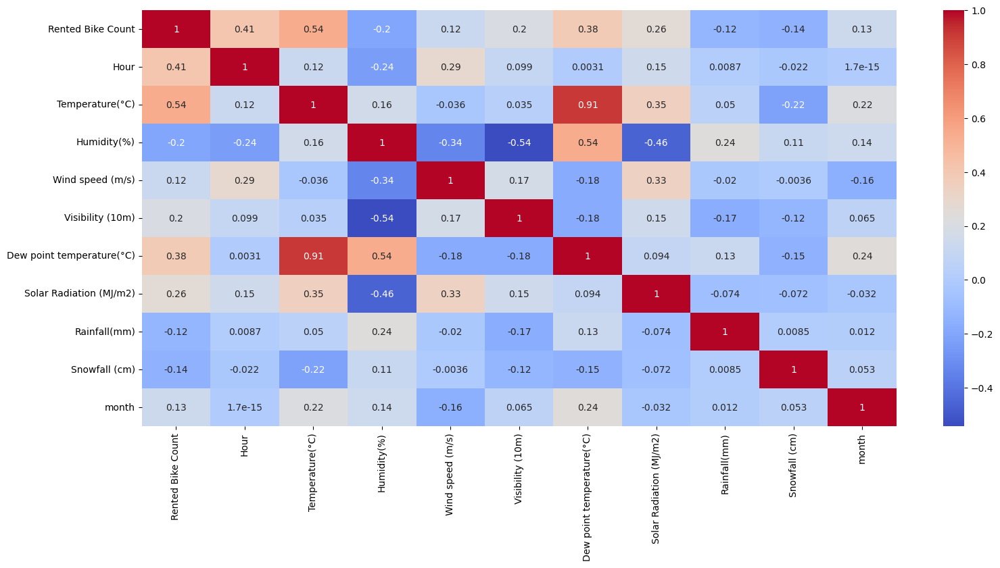

In [46]:
# Correlation Heatmap visualization code
# Select only numeric columns for correlation matrix
numeric_data = data.select_dtypes(include=np.number)

# Correlation Heatmap visualization code
corr = numeric_data.corr()

plt.figure(figsize = (18,8))
sns.heatmap(corr, annot = True , cmap = 'coolwarm')
plt.show()

##### 1. Why did you pick the specific chart?

the correlation between all the variables along with the correlation coeficients, i have used correlation heatmap.

##### 2. What is/are the insight(s) found from the chart?

Temperature and Dew point Temperature are highly correlated.
As per our regression assumption, there should not be colinearity between independent variables.
We can see from the heatmap that "Temperature" and "Dew Point Temperature" are highly corelated. We can drop one of them.As the corelation between temperature and our dependent variable "Bike Rented Count" is high. So we will Keep the Temperature column and drop the "Dew Point Temperature" column.

#### Chart - 15 - Pair Plot

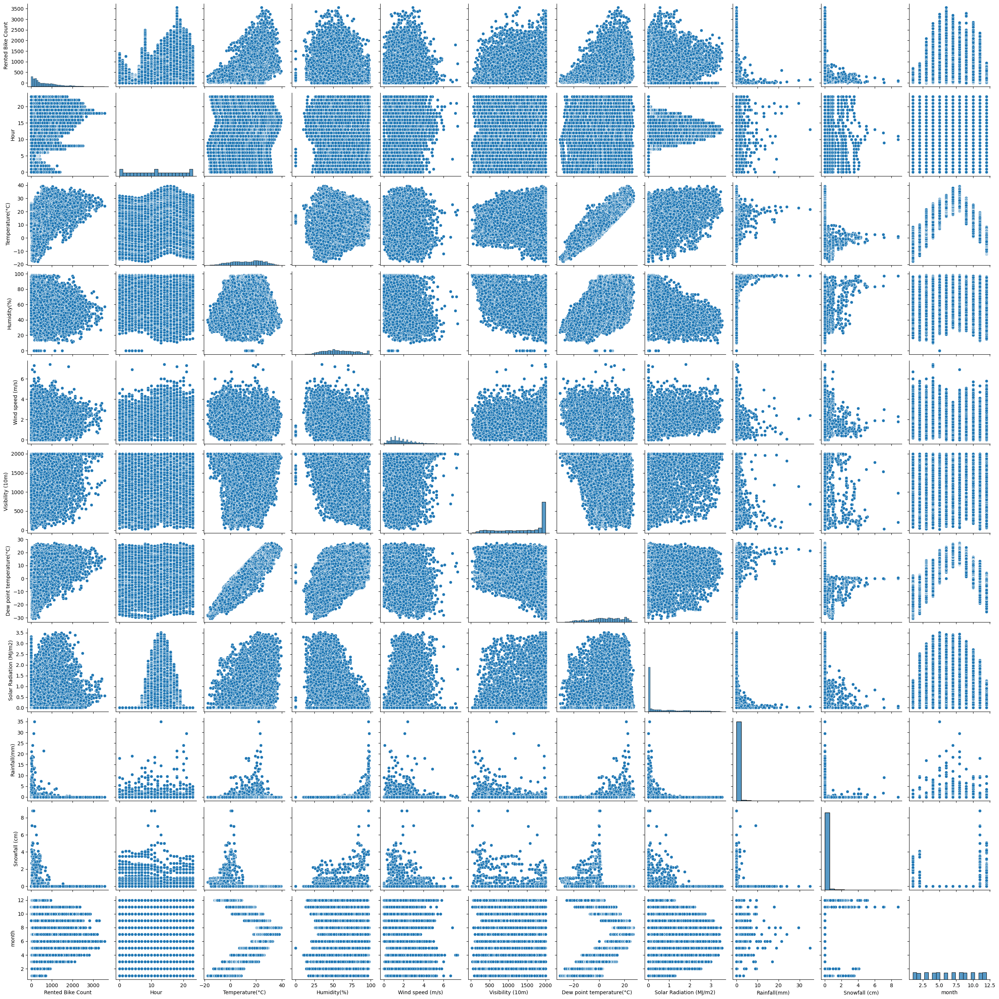

In [43]:
# Pair Plot visualization code
sns.pairplot(data = data)

##### 1. Why did you pick the specific chart?

used pair plot to analyse the patterns of data and realationship between the features. It's exactly same as the correlation map but here you will get the graphical representation.

##### 2. What is/are the insight(s) found from the chart?

From above pair plot we got to know that, there is not clear linear relationship between variables. other than dew point temp, temperature & solar radiation there is not any reationship.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Based on above chart experiments we have noticed that our dependent variable does not seems to normally distributed so we have made hypothetical assumption that our data is normally distributed and for that we have decided to do statistical analysis.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

## Normality test

for normality test we decided
1. Null hypothesis : Data is normally distributed
2. Alternate hypothesis : Data is not normally distributed


#### 2. Perform an appropriate statistical test.

In [47]:
# Perform Statistical Test to obtain P-Value
from scipy.stats import shapiro
test_data = data['Rented Bike Count']

stats,p  = shapiro(test_data)
print('stats = %.2f, p=%.3f' % (stats,p))

if p <= 0.05:
  print("Reject null hypothesis i.e  Data is not normally distributed")
else:
  print('Accept null hypothesis i.e  Data is normally distributed')

stats = 0.88, p=0.000
Reject null hypothesis i.e  Data is not normally distributed


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 8760.
  res = hypotest_fun_out(*samples, **kwds)


##### Which statistical test have you done to obtain P-Value?

We use Shapiro-wilk statistical test to obtain the p-value and we got very less p-value which is less than 0.05.

##### Why did you choose the specific statistical test?

The Shapiro-Wilk test is used to test the normality of a sample. The test checks whether the sample data fits a normal distribution, which is often assumed for statistical analysis. The test results can help determine if the data should be transformed or if non-parametric statistical methods should be used instead of traditional parametric methods.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [48]:
# Handling Missing Values & Missing Value Imputation

# Checking if there is any null value in the dataset.

data.isnull().sum()

,0
Rented Bike Count,0
Hour,0
Temperature(°C),0
Humidity(%),0
Wind speed (m/s),0
Visibility (10m),0
Dew point temperature(°C),0
Solar Radiation (MJ/m2),0
Rainfall(mm),0
Snowfall (cm),0


#### What all missing value imputation techniques have you used and why did you use those techniques?

***No missing/null values in the dataset.***

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [49]:
# Manipulating Features to minimize feature correlation and creating new features

# Defining a function for getting the variance inflation factor.

def Calculate_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [50]:
# Calculating VIF for variables.

Calculate_vif(data[[i for i in data.describe().columns if i not in ['Rented Bike Count']]])

# Not including 'Rented Bike Count' is the dependent variable.

,variables,VIF
0,Hour,4.425156
1,Temperature(°C),34.345199
2,Humidity(%),6.776495
3,Wind speed (m/s),4.877759
4,Visibility (10m),9.356009
5,Dew point temperature(°C),17.435051
6,Solar Radiation (MJ/m2),2.882197
7,Rainfall(mm),1.081894
8,Snowfall (cm),1.131825
9,month,5.093120


In [51]:
#Not including 'Dew point temperature(°C)' as it has high VIF.

Calculate_vif(data[[i for i in data.describe().columns if i not in ['Rented Bike Count','Dew point temperature(°C)']]])

,variables,VIF
0,Hour,3.952873
1,Temperature(°C),3.285991
2,Humidity(%),6.034847
3,Wind speed (m/s),4.651738
4,Visibility (10m),5.339713
5,Solar Radiation (MJ/m2),2.253453
6,Rainfall(mm),1.079756
7,Snowfall (cm),1.130941
8,month,5.002899


In [52]:
#Not including 'Humidity(%)' as it has high VIF.

Calculate_vif(data[[i for i in data.describe().columns if i not in ['Rented_Bike_Count','Dew point temperature(°C)','Humidity(%)']]])

,variables,VIF
0,Rented Bike Count,3.923702
1,Hour,4.548821
2,Temperature(°C),3.651591
3,Wind speed (m/s),4.273472
4,Visibility (10m),5.305577
5,Solar Radiation (MJ/m2),1.912733
6,Rainfall(mm),1.082364
7,Snowfall (cm),1.095741
8,month,4.038203


In [53]:
#Not including 'Visibility (10m)' as it has high VIF.

Calculate_vif(data[[i for i in data.describe().columns if i not in ['Rented_Bike_Count','Dew point temperature(°C)','Humidity(%)','Visibility (10m)']]])

,variables,VIF
0,Rented Bike Count,3.881331
1,Hour,4.424177
2,Temperature(°C),3.651244
3,Wind speed (m/s),3.629387
4,Solar Radiation (MJ/m2),1.910566
5,Rainfall(mm),1.070681
6,Snowfall (cm),1.090468
7,month,3.219716


## Now we have VIF values in the range of 1 to 5. we will drop 'Humidity', 'Dew point temperature(°C)', 'Visibility' because these columns from our dataset  shown colinearity in VIF test.

#### 2. Feature Selection

In [54]:
# Selecting the features which are not colinear among themselves and whose VIF is less than 5.

features = list(set(data.describe().columns) - set(['Rented_Bike_Count','Dew point temperature(°C)','Humidity(%)','Visibility (10m)']))
features

['month',
 'Solar Radiation (MJ/m2)',
 'Wind speed (m/s)',
 'Snowfall (cm)',
 'Temperature(°C)',
 'Rainfall(mm)',
 'Hour',
 'Rented Bike Count']

##### What all feature selection methods have you used  and why?

Used VIF(Variance Inflation Factor). It is a measure of multicollinearity in regression analysis that quantifies how much the variance of the estimated regression coefficients are increased due to the linear dependence between the predictor variables.

And along with that we did manual feature elimination using VIF.

##### Which all features you found important and why?

I have selected these features as they show least amount of multicolinearity -

['Snowfall (cm)',
 'Wind speed (m/s)',
 'Solar Radiation (MJ/m2)',
 'Rented Bike Count',
 'Temperature(°C)',
 'Hour',
 'Rainfall(mm)',
 'month']  

### 2. Categorical Encoding

In [55]:
# Encode your categorical columns

# Converting snowfall and rainfall to categorical attributes
data['Snowfall (cm)'] = data['Snowfall (cm)'].apply(lambda x: 1 if x>0 else 0)
data['Rainfall(mm)'] = data['Rainfall(mm)'].apply(lambda x: 1 if x>0 else 0)

# encoding the visibility column
data['Visibility (10m)'] = data['Visibility (10m)'].apply(lambda x: 0 if 0<=x<=399 else (1 if 400<=x<=999 else 2))

# encoding
data['Functioning Day'] = np.where(data['Functioning Day'] == 'Yes',1,0)
data['Holiday'] = np.where(data['Holiday'] == 'Holiday', 1,0)

# one hot encoding
data = pd.get_dummies(data, columns = ['Hour', 'Visibility (10m)', 'month', 'day' ,'Seasons'])

In [56]:
print(data.columns)
print(data.shape)

Index(['Rented Bike Count', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Holiday',
       'Functioning Day', 'Hour_0', 'Hour_1', 'Hour_2', 'Hour_3', 'Hour_4',
       'Hour_5', 'Hour_6', 'Hour_7', 'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11',
       'Hour_12', 'Hour_13', 'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17',
       'Hour_18', 'Hour_19', 'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23',
       'Visibility (10m)_0', 'Visibility (10m)_1', 'Visibility (10m)_2',
       'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12',
       'day_Friday', 'day_Monday', 'day_Saturday', 'day_Sunday',
       'day_Thursday', 'day_Tuesday', 'day_Wednesday', 'Seasons_Autumn',
       'Seasons_Spring', 'Seasons_Summer', 'Seasons_Winter'],
      dtype='object')
(8760, 60)


In [57]:
data.nunique()

,0
Rented Bike Count,2166
Temperature(°C),546
Humidity(%),90
Wind speed (m/s),65
Dew point temperature(°C),556
Solar Radiation (MJ/m2),345
Rainfall(mm),2
Snowfall (cm),2
Holiday,2
Functioning Day,2


#### What all categorical encoding techniques have you used & why did you use those techniques?

I used manual categorical encoding and One hot encoding which is a technique used in data preprocessing and feature engineering to represent categorical variables as numerical features that can be used as inputs to machine learning models.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

/tmp/ipython-input-1634331709.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data[dependent_variable])


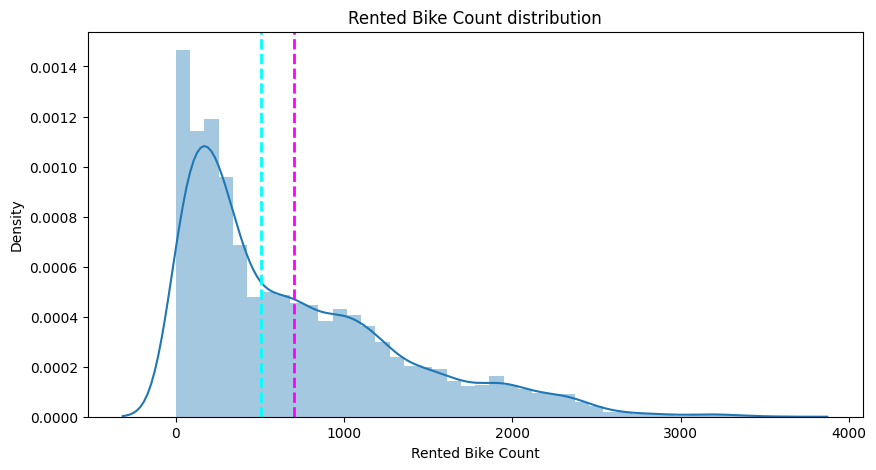

In [58]:
# Transform Your data
# visualizing the distribution of the dependent variable - rental bike count
dependent_variable=['Rented Bike Count']
plt.figure(figsize=(10,5))
sns.distplot(data[dependent_variable])
plt.xlabel(dependent_variable[0])
plt.title(dependent_variable[0]+' distribution')
plt.axvline(data[dependent_variable[0]].mean(), color='magenta', linestyle='dashed', linewidth=2)
plt.axvline(data[dependent_variable[0]].median(), color='cyan', linestyle='dashed', linewidth=2)

In [59]:
# skew of the dependent variable
data[dependent_variable].skew()

,0
Rented Bike Count,1.153428


/tmp/ipython-input-1597049343.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.log1p(data[dependent_variable]))


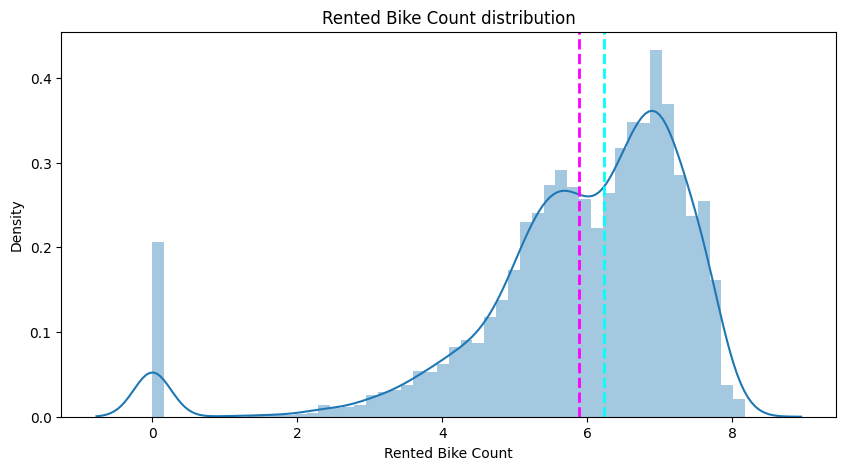

In [60]:
# visualizing the distribution of dependent variable after log transformation
plt.figure(figsize=(10,5))
sns.distplot(np.log1p(data[dependent_variable]))
plt.xlabel(dependent_variable[0])
plt.title(dependent_variable[0]+' distribution')
plt.axvline(np.log1p(data['Rented Bike Count']).mean(), color='magenta', linestyle='dashed', linewidth=2)
plt.axvline(np.log1p(data['Rented Bike Count']).median(), color='cyan', linestyle='dashed', linewidth=2)

In [61]:
# skew of the dependent variable after log transformation
np.log1p(data[dependent_variable]).skew()

,0
Rented Bike Count,-1.832199


/tmp/ipython-input-2175867718.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.sqrt(data[dependent_variable]))


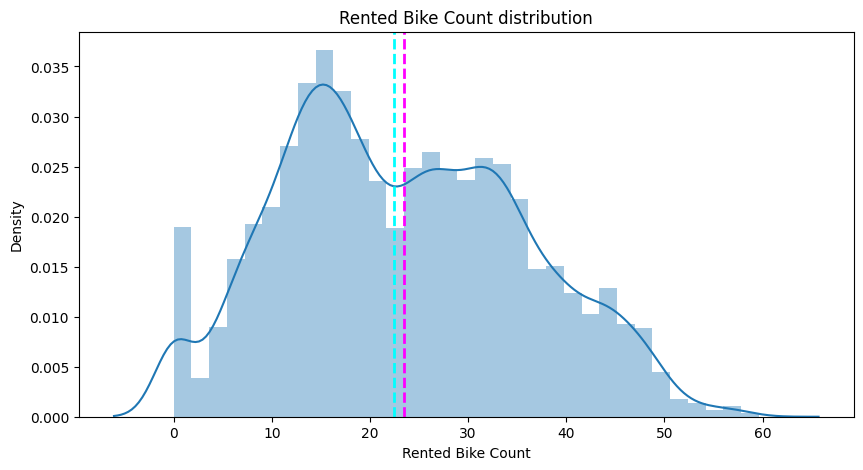

In [62]:
# visualizing the distribution of dependent variable after sqrt transformation
plt.figure(figsize=(10,5))
sns.distplot(np.sqrt(data[dependent_variable]))
plt.xlabel(dependent_variable[0])
plt.title(dependent_variable[0]+' distribution')
plt.axvline(np.sqrt(data['Rented Bike Count']).mean(), color='magenta', linestyle='dashed', linewidth=2)
plt.axvline(np.sqrt(data['Rented Bike Count']).median(), color='cyan', linestyle='dashed', linewidth=2)

In [63]:
# # skew of the dependent variable after sqrt transformation
np.sqrt(data[dependent_variable]).skew()

,0
Rented Bike Count,0.237362


In [64]:
# Defining dependent and independent variables
X = data.drop('Rented Bike Count',axis=1)
y = np.sqrt(data[dependent_variable])

In [65]:
X.head()

,Temperature(°C),Humidity(%),Wind speed (m/s),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Functioning Day,Hour_0,...,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,Seasons_Autumn,Seasons_Spring,Seasons_Summer,Seasons_Winter
0,-5.2,37,2.2,-17.6,0.0,0,0,0,1,True,...,False,False,False,False,False,False,False,False,False,True
1,-5.5,38,0.8,-17.6,0.0,0,0,0,1,False,...,False,False,False,False,False,False,False,False,False,True
2,-6.0,39,1.0,-17.7,0.0,0,0,0,1,False,...,False,False,False,False,False,False,False,False,False,True
3,-6.2,40,0.9,-17.6,0.0,0,0,0,1,False,...,False,False,False,False,False,False,False,False,False,True
4,-6.0,36,2.3,-18.6,0.0,0,0,0,1,False,...,False,False,False,False,False,False,False,False,False,True


In [66]:
features = [i for i in data.columns if i not in ['Rented Bike Count']]
features

['Temperature(°C)',
 'Humidity(%)',
 'Wind speed (m/s)',
 'Dew point temperature(°C)',
 'Solar Radiation (MJ/m2)',
 'Rainfall(mm)',
 'Snowfall (cm)',
 'Holiday',
 'Functioning Day',
 'Hour_0',
 'Hour_1',
 'Hour_2',
 'Hour_3',
 'Hour_4',
 'Hour_5',
 'Hour_6',
 'Hour_7',
 'Hour_8',
 'Hour_9',
 'Hour_10',
 'Hour_11',
 'Hour_12',
 'Hour_13',
 'Hour_14',
 'Hour_15',
 'Hour_16',
 'Hour_17',
 'Hour_18',
 'Hour_19',
 'Hour_20',
 'Hour_21',
 'Hour_22',
 'Hour_23',
 'Visibility (10m)_0',
 'Visibility (10m)_1',
 'Visibility (10m)_2',
 'month_1',
 'month_2',
 'month_3',
 'month_4',
 'month_5',
 'month_6',
 'month_7',
 'month_8',
 'month_9',
 'month_10',
 'month_11',
 'month_12',
 'day_Friday',
 'day_Monday',
 'day_Saturday',
 'day_Sunday',
 'day_Thursday',
 'day_Tuesday',
 'day_Wednesday',
 'Seasons_Autumn',
 'Seasons_Spring',
 'Seasons_Summer',
 'Seasons_Winter']

###  We plot distribution plot and also we did normality test using shapiro wilk and we have found that our data is not normally distributed it needs transformation.

So, first we have calculate the skewness value and we have found that rented bike attribute is positively skewed so we used log transfomation but it affected negatively

So, we finally used square root transformation & now our data looks normally distrubuted & skewness is also reduced.

### 6. Data Scaling

In [67]:
# Scaling your data
scaler = StandardScaler()
X = scaler.fit_transform(data[features])

In [68]:
features

['Temperature(°C)',
 'Humidity(%)',
 'Wind speed (m/s)',
 'Dew point temperature(°C)',
 'Solar Radiation (MJ/m2)',
 'Rainfall(mm)',
 'Snowfall (cm)',
 'Holiday',
 'Functioning Day',
 'Hour_0',
 'Hour_1',
 'Hour_2',
 'Hour_3',
 'Hour_4',
 'Hour_5',
 'Hour_6',
 'Hour_7',
 'Hour_8',
 'Hour_9',
 'Hour_10',
 'Hour_11',
 'Hour_12',
 'Hour_13',
 'Hour_14',
 'Hour_15',
 'Hour_16',
 'Hour_17',
 'Hour_18',
 'Hour_19',
 'Hour_20',
 'Hour_21',
 'Hour_22',
 'Hour_23',
 'Visibility (10m)_0',
 'Visibility (10m)_1',
 'Visibility (10m)_2',
 'month_1',
 'month_2',
 'month_3',
 'month_4',
 'month_5',
 'month_6',
 'month_7',
 'month_8',
 'month_9',
 'month_10',
 'month_11',
 'month_12',
 'day_Friday',
 'day_Monday',
 'day_Saturday',
 'day_Sunday',
 'day_Thursday',
 'day_Tuesday',
 'day_Wednesday',
 'Seasons_Autumn',
 'Seasons_Spring',
 'Seasons_Summer',
 'Seasons_Winter']

##### Which method have you used to scale you data and why?

**In this we have different independent features of different scale so we have used standard scalar method to scale our independent features into one scale.**

### 8. Data Splitting

In [69]:
# Split your data to train and test. Choose Splitting ratio wisely.
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size = 0.2, random_state = 0)

##### What data splitting ratio have you used and why?

To train the model we have split the data into train and test using train_test_split method

We have split 80% of our data into train and 20% into test.

## ***7. ML Model Implementation***

## ***7. ML Model Implementation***

In [70]:
# Defining a function to print evaluation matrix
def evaluate_model(model, y_test, y_pred):

  '''takes model, y test and y pred values to print evaluation metrics, plot the actual and predicted values,
  plot the top 20 important features, and returns a list of the model scores'''

  # Squring the y test and and pred as we have used sqrt transformation
  y_t = np.square(y_test)
  y_p = np.square(y_pred)
  y_train2 = np.square(y_train)
  y_train_pred = np.square(model.predict(X_train))

  # Calculating Evaluation Matrix
  mse = mean_squared_error(y_t,y_p)
  mae=mean_absolute_error(y_t,y_p)
  rmse = np.sqrt(mse)
  r2_train = r2_score(y_train2, y_train_pred)
  r2 = r2_score(y_t,y_p)
  r2_adjusted = 1-(1-r2)*((len(X_test)-1)/(len(X_test)-X_test.shape[1]-1))
  # Printing Evaluation Matrix
  print("MSE :" , mse)
  print("RMSE :" ,rmse)
  print("MAE :" ,mae)
  print("Train R2 :" ,r2_train)
  print("Test R2 :" ,r2)
  print("Adjusted R2 : ", r2_adjusted)


  # plot actual and predicted values
  plt.figure(figsize=(18,6))
  plt.plot((y_p)[:100])
  plt.plot((np.array(y_t)[:100]))
  plt.legend(["Predicted","Actual"])
  plt.title('Actual and Predicted Bike Count', fontsize=18)

  try:
    importance = model.feature_importances_
  except:
    importance = model.coef_
  importance = np.absolute(importance)
  if len(importance)==len(features):
    pass
  else:
    importance = importance[0]

  # Feature importances


  feat = pd.Series(importance, index=features)
  plt.figure(figsize=(12,8))
  plt.title('Feature Importances (top 20) for '+str(model), fontsize = 18)
  plt.xlabel('Relative Importance')
  feat.nlargest(20).plot(kind='barh')


  model_score = [mse,mae,rmse,r2_train,r2,r2_adjusted]
  return model_score

In [71]:
# Create a score dataframe
check_score = pd.DataFrame(index = ['MSE', 'RMSE','MAE', 'Train R2', 'Test R2', 'Adjusted R2'])

### ML Model - 1

In [72]:
# ML Model - 1 Implementation
reg = LinearRegression()
# Fit the Algorithm
reg.fit(X_train, y_train)
# Predict on the model
y_pred_li = reg.predict(X_test)

In [73]:
# Checking model train and test score:

print(f'Linear Regression model train score is :{reg.score(X_train, y_train)}')

print(f'Linear Regression model test score is :{reg.score(X_test, y_test)}')

Linear Regression model train score is :0.8068941400040528
Linear Regression model test score is :0.8065405870713578


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

MSE : 88338.63688933366
RMSE : 297.21816379443175
MAE : 201.72017879497952
Train R2 : 0.7836428506331535
Test R2 : 0.7889274334855457
Adjusted R2 :  0.7815673380810819


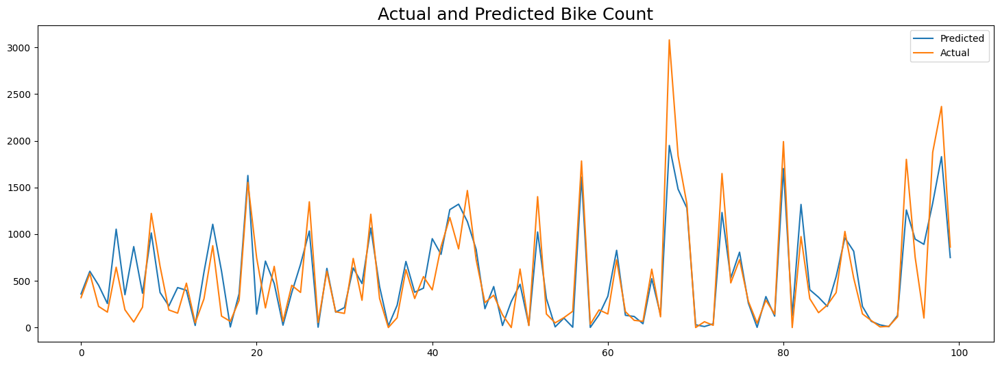

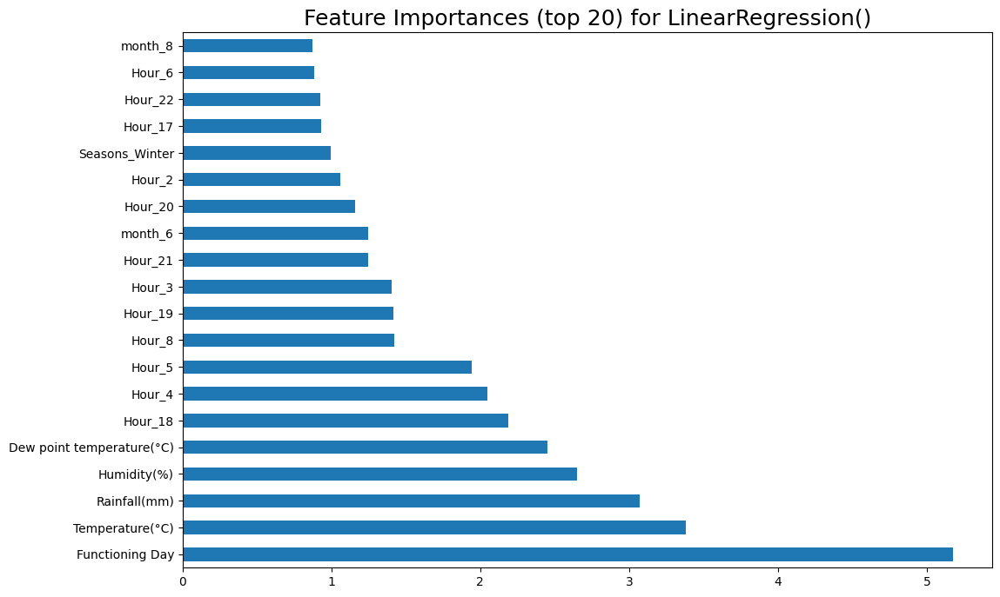

In [74]:
# Visualizing evaluation Metric Score chart
linear_score = evaluate_model(reg, y_test,y_pred_li)
# Evaluation Metric Score chart
check_score['Linear regression'] = linear_score

In [75]:
check_score

,Linear regression
MSE,88338.636889
RMSE,201.720179
MAE,297.218164
Train R2,0.783643
Test R2,0.788927
Adjusted R2,0.781567


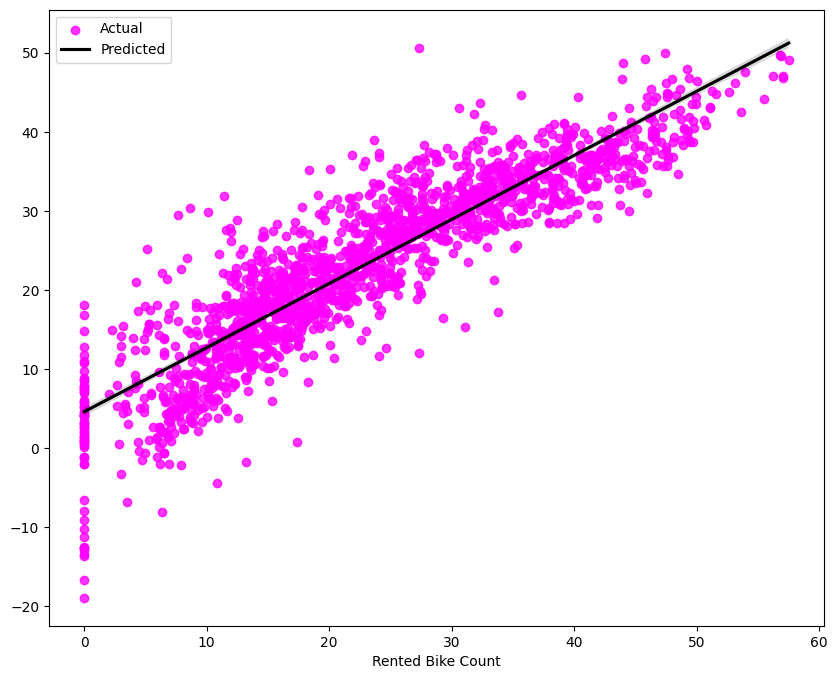

In [76]:
#visualizing linearity between real and predicted data:
def reg_scatter(true, pred):
  plt.figure(figsize=(10,8))

  sns.regplot(x= true, y = pred, scatter_kws={'color':'magenta'},line_kws={'color':'black'})

  plt.legend(["Actual","Predicted",])
  plt.show()
y_test_pred = reg.predict(X_test)
reg_scatter(y_test, y_test_pred)

So, using linear regression model we have got accuracy(i.e R2 score) around 75% on train data and same 75% on test data. Which seems to low to predict on unseen data, so we have decided to tune our model.

### ML Model - 2 : Lasso Regression

In [77]:
# Import the Lasso Regression class
lasso = Lasso()

# Initialize an instance of the class
lasso.fit(X_train, y_train)

# Fit the lasso regression model to your training data
y_pred_lasso1 = lasso.predict(X_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

MSE : 190005.60475831304
RMSE : 435.89632340536326
MAE : 292.0293831356247
Train R2 : 0.5420216576977228
Test R2 : 0.5460087221097865
Adjusted R2 :  0.530178056982409


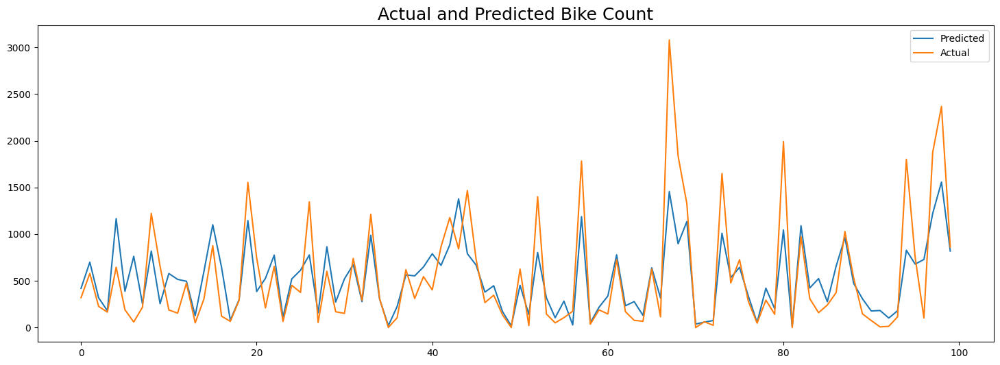

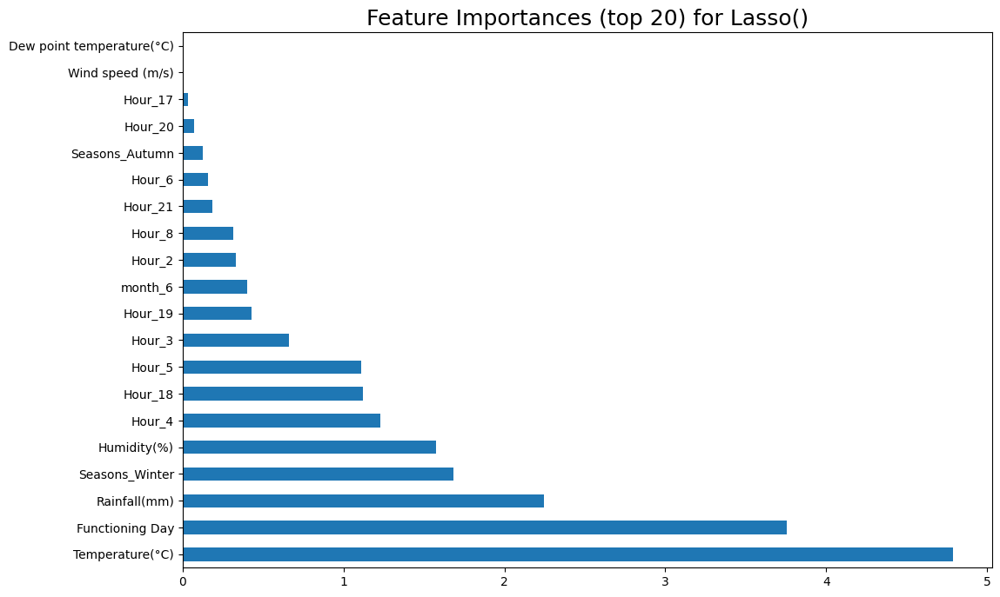

In [78]:
lasso_score = evaluate_model(lasso, y_test,y_pred_lasso1)
check_score['Lasso regression'] = lasso_score

In [79]:
check_score

,Linear regression,Lasso regression
MSE,88338.636889,190005.604758
RMSE,201.720179,292.029383
MAE,297.218164,435.896323
Train R2,0.783643,0.542022
Test R2,0.788927,0.546009
Adjusted R2,0.781567,0.530178


It is seen that using Lasso regression analysis the performance of the model has drop down. so we will try to tuned the model.

#### 2. Cross- Validation & Hyperparameter Tuning

In [80]:
#import Lasso regressor and grid search cv
lasso = Lasso()

parameters = {'alpha': [1e-15,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1,5,10,20,30,40,45,50,55,60,100]}
lasso_regressor = GridSearchCV(lasso, parameters, scoring='neg_mean_squared_error', cv=5)
#fitting model
lasso_regressor.fit(X_train,y_train)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.479e+04, tolerance: 8.747e+01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.315e+04, tolerance: 8.603e+01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.421e+04, tolerance: 8.738e

GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 1e-05, 0.0001, 0.001,
                                   0.01, 1, 5, 10, 20, 30, 40, 45, 50, 55, 60,
                                   100]},
             scoring='neg_mean_squared_error')

In [81]:
#getting optimum parameters
print("The optimum alpha value is found out to be :" ,lasso_regressor.best_params_)
print("\nUsing ",lasso_regressor.best_params_, " the negative mean squared error is: ", lasso_regressor.best_score_)

The optimum alpha value is found out to be : {'alpha': 0.001}

Using  {'alpha': 0.001}  the negative mean squared error is:  -30.369544420120356


In [82]:
# Import the Lasso Regression class with best alpha
lasso = Lasso(alpha = lasso_regressor.best_params_['alpha'])

# Initialize an instance of the class
lasso.fit(X_train, y_train)

# Fit the lasso regression model to your training data
y_pred_lassocv = lasso.predict(X_test)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.291e+03, tolerance: 1.082e+02
  model = cd_fast.enet_coordinate_descent(


MSE : 88388.8330445258
RMSE : 297.302595085421
MAE : 201.77199163885396
Train R2 : 0.783546246041207
Test R2 : 0.788807496935938
Adjusted R2 :  0.7814432193468247


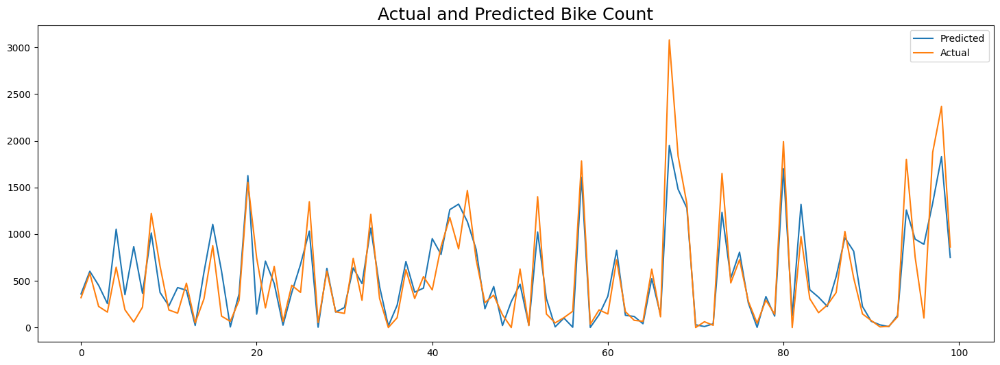

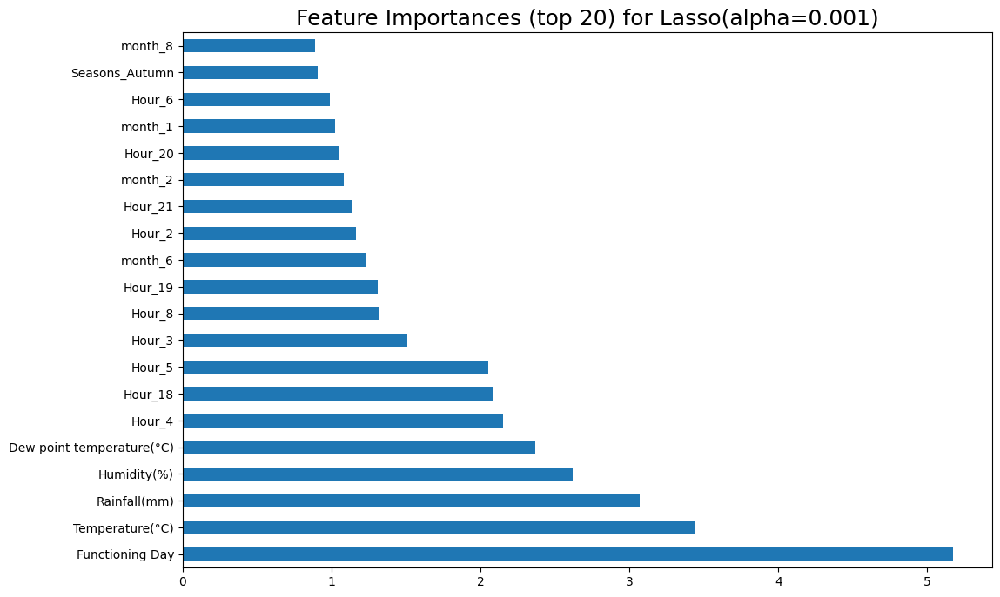

In [83]:
#Evaluation matrices for Lasso regression
lasso2 = evaluate_model(lasso, y_test,y_pred_lassocv)

name = 'Lasso with alpha = ' + str(lasso_regressor.best_params_['alpha'])

check_score[name] = lasso2

##### Which hyperparameter optimization technique have you used and why?

GridSearchCV is used to find the best hyperparameters for a machine learning model by searching over a specified parameter grid. It helps to ensure that a model is not overfitting or underfitting by evaluating the model's performance using cross-validation techniques. GridSearchCV can save time and resources compared to manually tuning the parameters of a model.

To reduce time and effort we have used GridSearchCV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [84]:
check_score

,Linear regression,Lasso regression,Lasso with alpha = 0.001
MSE,88338.636889,190005.604758,88388.833045
RMSE,201.720179,292.029383,201.771992
MAE,297.218164,435.896323,297.302595
Train R2,0.783643,0.542022,0.783546
Test R2,0.788927,0.546009,0.788807
Adjusted R2,0.781567,0.530178,0.781443


After tuning we have seen that there is increse in performance from 53% to 75%

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

RMSE & MSE are measuring the average squared values between the predicted and actual values.

Whereas R2 score is a measure how well the model fits the data.

In a business context, a low RMSE and high R2 score would indicate that the model is making accurate predictions and is a good fit for the data. This would be desirable for a business because it would mean that the model is able to provide useful insights and make accurate predictions about future outcomes.

### ML Model - 3 : Ridge Regression

In [85]:
# Ridge regressor class
ridge = Ridge()

#prediction for Ridge regression
ridge.fit(X_train, y_train)

# Predict on the model
y_pred_ridge1 = ridge.predict(X_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

MSE : 88349.76579866848
RMSE : 297.23688499018505
MAE : 201.73310758657314
Train R2 : 0.7836202436457578
Test R2 : 0.788900842544837
Adjusted R2 :  0.7815398199148993


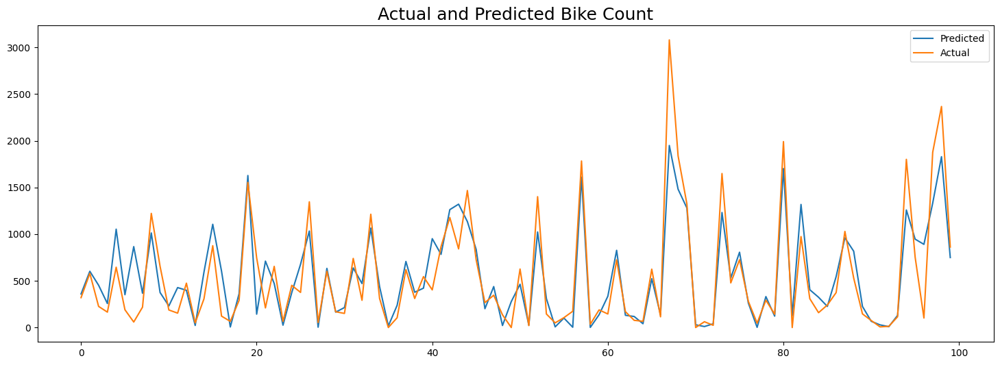

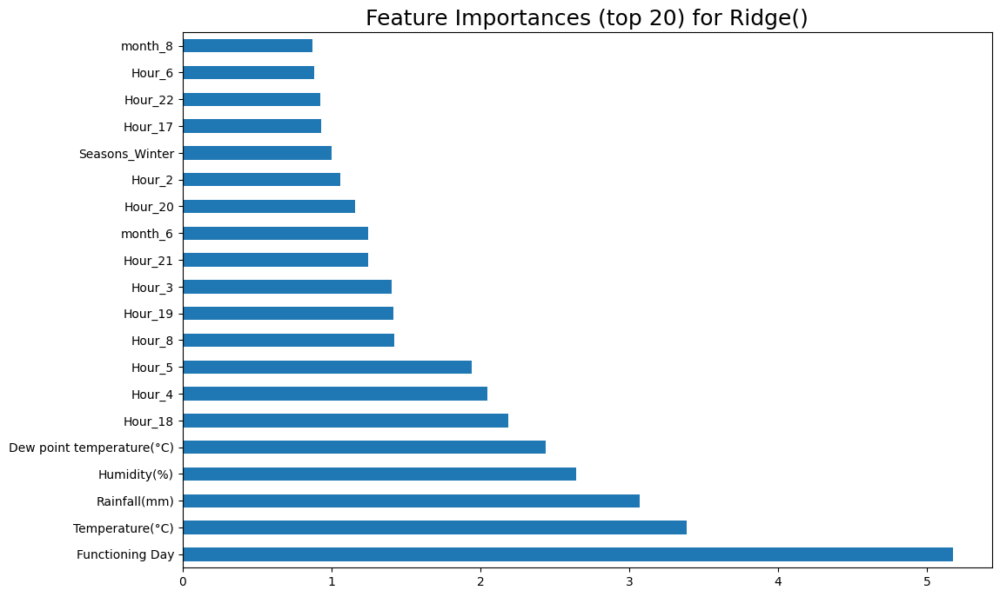

In [86]:
# Evaluation Metric Score chart
result = evaluate_model(ridge, y_test,y_pred_ridge1)
check_score['Ridge'] = result

In [87]:
check_score

,Linear regression,Lasso regression,Lasso with alpha = 0.001,Ridge
MSE,88338.636889,190005.604758,88388.833045,88349.765799
RMSE,201.720179,292.029383,201.771992,201.733108
MAE,297.218164,435.896323,297.302595,297.236885
Train R2,0.783643,0.542022,0.783546,0.783620
Test R2,0.788927,0.546009,0.788807,0.788901
Adjusted R2,0.781567,0.530178,0.781443,0.781540


We have used Ridge regression technique to check the performance of the model and we have found that there is no significant difference in between linear regression and Ridge

#### 2. Cross- Validation & Hyperparameter Tuning

In [88]:
# Import Ridge regressor Class
ridge = Ridge()
parameters = {'alpha': [1e-15,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1,5,10,20,30,40,45,50,55,60,100]}
ridge_regressor = GridSearchCV(ridge, parameters, scoring='neg_mean_squared_error', cv=5)
#fitting model
ridge_regressor.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 1e-05, 0.0001, 0.001,
                                   0.01, 1, 5, 10, 20, 30, 40, 45, 50, 55, 60,
                                   100]},
             scoring='neg_mean_squared_error')

In [89]:
#getting optimum parameters
print("The best fit alpha value is found out to be :" ,ridge_regressor.best_params_)
print("\nUsing ",ridge_regressor.best_params_, " the negative mean squared error is: ", ridge_regressor.best_score_)

The best fit alpha value is found out to be : {'alpha': 30}

Using  {'alpha': 30}  the negative mean squared error is:  -30.351989130624276


In [90]:
# Initiate ridge with best alpha
ridge = Ridge(alpha = ridge_regressor.best_params_['alpha'])

#prediction for Ridge regression
ridge.fit(X_train, y_train)

# Predict on model
y_pred_ridge = ridge.predict(X_test)

MSE : 88678.7401701656
RMSE : 297.78975833659155
MAE : 202.11771476515023
Train R2 : 0.7829162150349984
Test R2 : 0.7881148052303111
Adjusted R2 :  0.7807263734977983


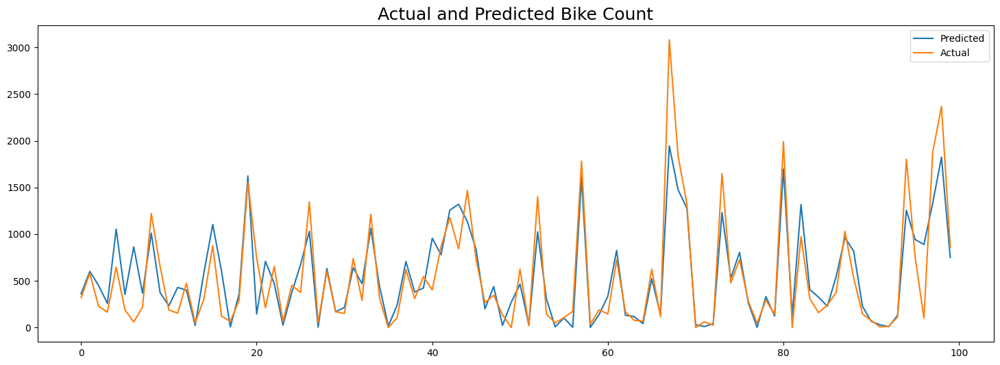

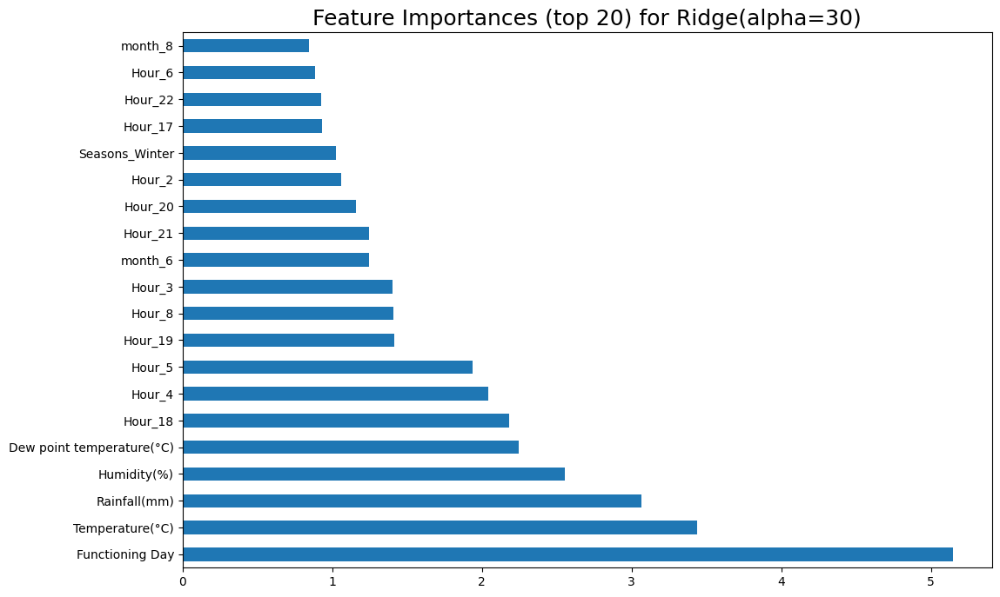

In [91]:
#Evaluation matrices for Ridge regression
result = evaluate_model(ridge, y_test,y_pred_ridge)

namer = 'Ridge with alpha = ' + str(ridge_regressor.best_params_['alpha'])

check_score[namer] = result

##### Which hyperparameter optimization technique have you used and why?

GridSearchCV is used to find the best hyperparameters for a machine learning model by searching over a specified parameter grid. It helps to ensure that a model is not overfitting or underfitting by evaluating the model's performance using cross-validation techniques. GridSearchCV can save time and resources compared to manually tuning the parameters of a model.

To reduce time and effort we have used GridSearchCV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [92]:
check_score

,Linear regression,Lasso regression,Lasso with alpha = 0.001,Ridge,Ridge with alpha = 30
MSE,88338.636889,190005.604758,88388.833045,88349.765799,88678.740170
RMSE,201.720179,292.029383,201.771992,201.733108,202.117715
MAE,297.218164,435.896323,297.302595,297.236885,297.789758
Train R2,0.783643,0.542022,0.783546,0.783620,0.782916
Test R2,0.788927,0.546009,0.788807,0.788901,0.788115
Adjusted R2,0.781567,0.530178,0.781443,0.781540,0.780726


We have tuned Ridge regression using hyperparametric technique & check the performance of the model and we have found that there is no significant difference in between tuned and without tuned.

It performs well only when there is multicolinearity or overfitting situation is present in our case we have already handle the multicolinearity situation,  thats why it is not showing any difference in performance.

### ML Model - 4 : Random Forest

In [93]:
# ML Model - 4 Implementation
rf = RandomForestRegressor(random_state=0)
# Fit the Algorithm
rf.fit(X_train,y_train)
# Predict on the model
y_pred_rf1 = rf.predict(X_test)

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

MSE : 41137.24168859196
RMSE : 202.8231783810518
MAE : 114.34776173181191
Train R2 : 0.9883218797215341
Test R2 : 0.9017084314600181
Adjusted R2 :  0.8982810067887067


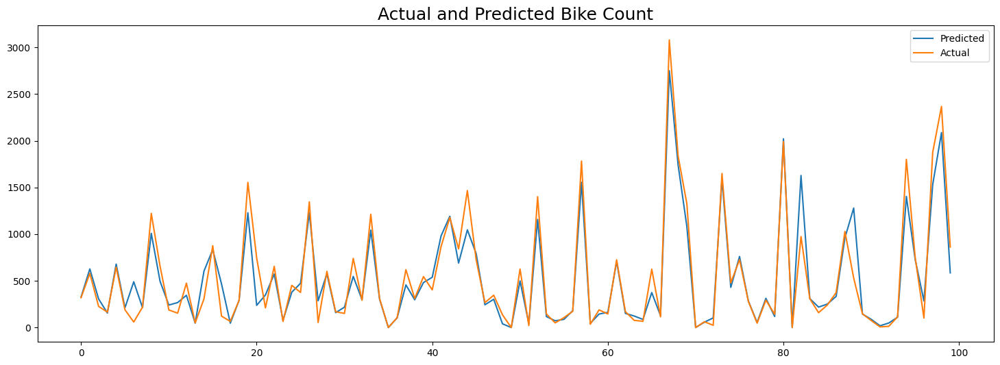

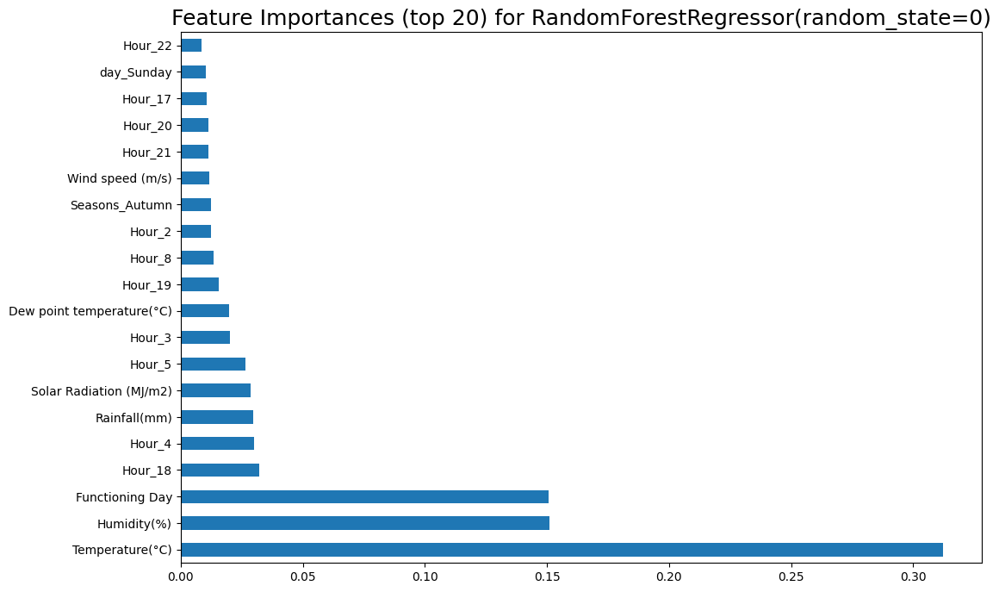

In [94]:
# Visualizing evaluation Metric Score chart
result = evaluate_model(rf, y_test,y_pred_rf1)
check_score['Random forest'] = result

In [95]:
check_score

,Linear regression,Lasso regression,Lasso with alpha = 0.001,Ridge,Ridge with alpha = 30,Random forest
MSE,88338.636889,190005.604758,88388.833045,88349.765799,88678.740170,41137.241689
RMSE,201.720179,292.029383,201.771992,201.733108,202.117715,114.347762
MAE,297.218164,435.896323,297.302595,297.236885,297.789758,202.823178
Train R2,0.783643,0.542022,0.783546,0.783620,0.782916,0.988322
Test R2,0.788927,0.546009,0.788807,0.788901,0.788115,0.901708
Adjusted R2,0.781567,0.530178,0.781443,0.781540,0.780726,0.898281


Here we have seen that using random forest regression accuracy of the train and test model increases 98% and 90% respectively. which seems to be a good model for prediction.

#### 2. Cross- Validation & Hyperparameter Tuning

In [96]:
# random forest model
rf_model = RandomForestRegressor(random_state=0)
rf_params = {'n_estimators':[300],                    # limited due to computational power availability
             'min_samples_leaf':np.arange(20,25)}     # Approximate range from a decision tree model

In [97]:
# fitting a rf model with best parameters obtained from gridsearch
rf_gridsearch = GridSearchCV(rf_model,rf_params,cv=6,scoring='neg_root_mean_squared_error')
rf_gridsearch.fit(X_train,y_train)
rf_best_params = rf_gridsearch.best_params_

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example usi

In [98]:
# best parameters for random forests
rf_best_params

{'min_samples_leaf': np.int64(20), 'n_estimators': 300}

In [99]:
# Fitting RF model with best parameters
rf_model = RandomForestRegressor(n_estimators=rf_best_params['n_estimators'],
                                 min_samples_leaf=rf_best_params['min_samples_leaf'],
                                 random_state=0)

In [100]:
# fit
rf_model.fit(X_train,y_train)

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestRegressor(min_samples_leaf=np.int64(20), n_estimators=300,
                      random_state=0)

In [101]:
# rf predictions on test data
y_pred_rf = rf_model.predict(X_test)

MSE : 71994.86484295053
RMSE : 268.318588329155
MAE : 163.56756700546498
Train R2 : 0.8631176846020416
Test R2 : 0.827978544458414
Adjusted R2 :  0.82198016037038


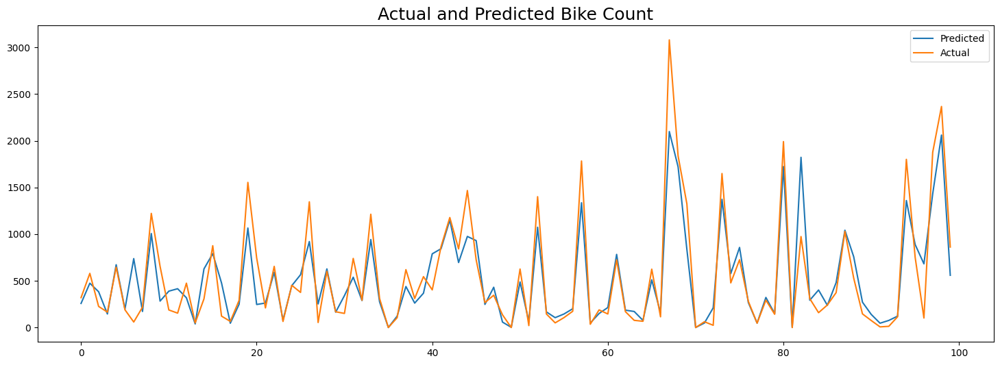

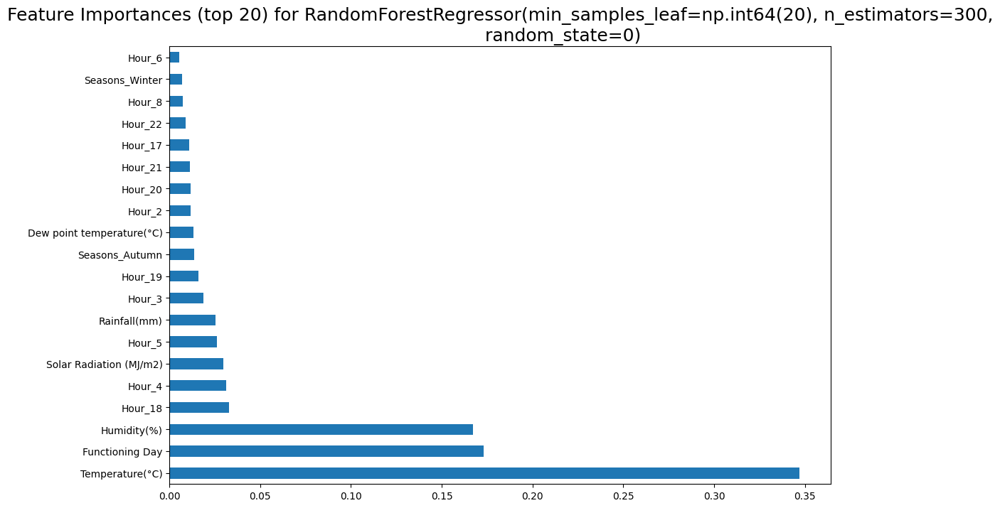

In [102]:
#Evaluation matrices for RandomForest
result = evaluate_model(rf_model, y_test,y_pred_rf)
check_score['Random forest tuned'] = result

##### Which hyperparameter optimization technique have you used and why?

GridSearchCV is used to find the best hyperparameters for a machine learning model by searching over a specified parameter grid. It helps to ensure that a model is not overfitting or underfitting by evaluating the model's performance using cross-validation techniques. GridSearchCV can save time and resources compared to manually tuning the parameters of a model.

To reduce time and effort we have used GridSearchCV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [103]:
check_score

,Linear regression,Lasso regression,Lasso with alpha = 0.001,Ridge,Ridge with alpha = 30,Random forest,Random forest tuned
MSE,88338.636889,190005.604758,88388.833045,88349.765799,88678.740170,41137.241689,71994.864843
RMSE,201.720179,292.029383,201.771992,201.733108,202.117715,114.347762,163.567567
MAE,297.218164,435.896323,297.302595,297.236885,297.789758,202.823178,268.318588
Train R2,0.783643,0.542022,0.783546,0.783620,0.782916,0.988322,0.863118
Test R2,0.788927,0.546009,0.788807,0.788901,0.788115,0.901708,0.827979
Adjusted R2,0.781567,0.530178,0.781443,0.781540,0.780726,0.898281,0.821980


After tuning the random forest algorithm it has seen that there is drop in performance both in train and test score so we are not going to use this model.

### ML Model - 6 : Gradient Boosting Regressor

In [104]:
# ML Model - 3 Implementation
gb = GradientBoostingRegressor(random_state=0)
# Fit the Algorithm
gb.fit(X_train,y_train)
# Predict on the model
y_pred_gb1 = gb.predict(X_test)

/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

MSE : 72224.99362303338
RMSE : 268.7470811432812
MAE : 177.20284452101373
Train R2 : 0.840396201159478
Test R2 : 0.8274286845788488
Adjusted R2 :  0.8214111268898133


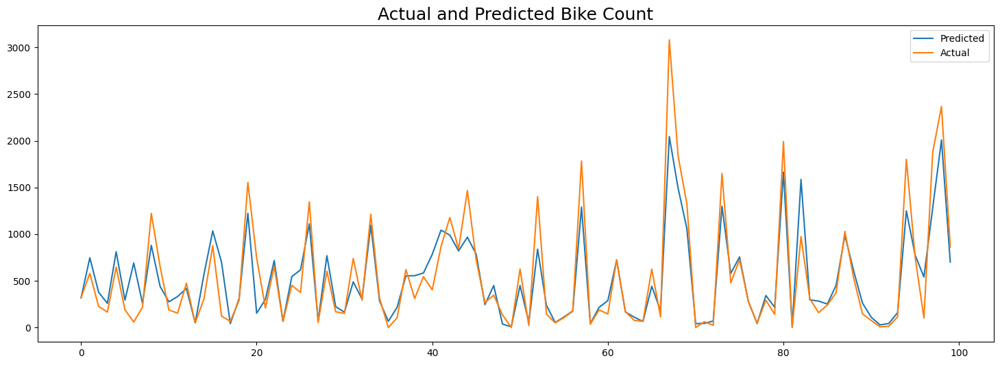

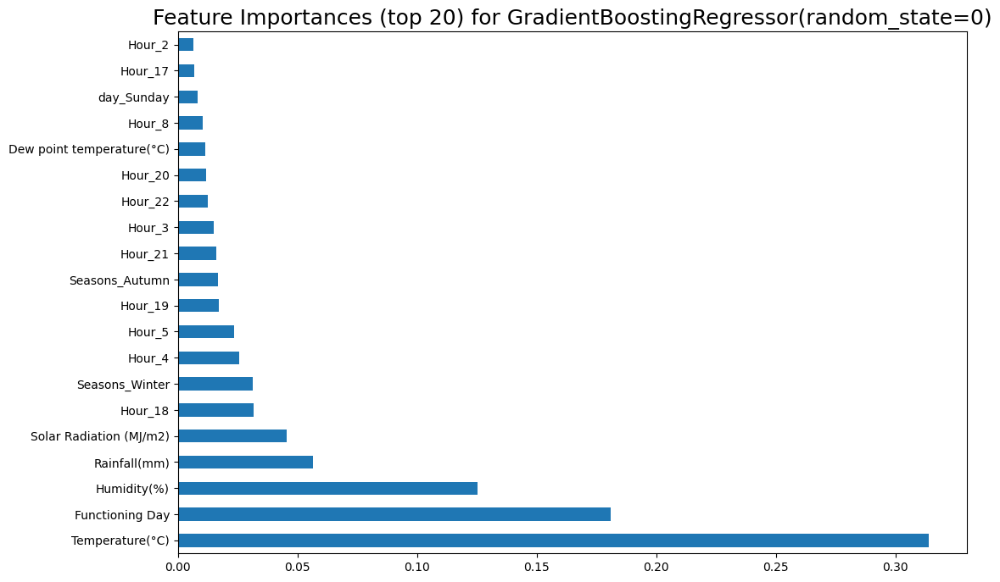

In [105]:
# Evaluation Metric Score chart
result = evaluate_model(gb, y_test,y_pred_gb1)
check_score['Gradient Boosting Regressor'] = result

In [106]:
check_score

,Linear regression,Lasso regression,Lasso with alpha = 0.001,Ridge,Ridge with alpha = 30,Random forest,Random forest tuned,Gradient Boosting Regressor
MSE,88338.636889,190005.604758,88388.833045,88349.765799,88678.740170,41137.241689,71994.864843,72224.993623
RMSE,201.720179,292.029383,201.771992,201.733108,202.117715,114.347762,163.567567,177.202845
MAE,297.218164,435.896323,297.302595,297.236885,297.789758,202.823178,268.318588,268.747081
Train R2,0.783643,0.542022,0.783546,0.783620,0.782916,0.988322,0.863118,0.840396
Test R2,0.788927,0.546009,0.788807,0.788901,0.788115,0.901708,0.827979,0.827429
Adjusted R2,0.781567,0.530178,0.781443,0.781540,0.780726,0.898281,0.821980,0.821411


Using Gradient Boosting Regressor we have got low accuracy around 82% and 81% on train and test data resp. which les than random forest, decision tree algorithm.

So, lets tune it.

#### 2. Cross- Validation & Hyperparameter Tuning

In [112]:
# GBM model
gb_model = GradientBoostingRegressor(random_state=0)
gb_params = {'n_estimators':[300],
             'min_samples_leaf':np.arange(20,24),
             'max_depth':np.arange(14,17)
             }

In [ ]:
# Perform the randomized search
random_search = RandomizedSearchCV(gb_model, param_distributions=gb_params, cv=6, n_iter=20, scoring='neg_root_mean_squared_error', n_jobs=-1)
random_search.fit(X_train, y_train)

gb_best_params = random_search.best_params_

/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 12 is smaller than n_iter=20. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


In [113]:
# GBM best parameters
gb_best_params

{'n_estimators': 300,
 'min_samples_leaf': np.int64(21),
 'max_depth': np.int64(16)}

In [114]:
# Building GBM model with best parameters
gb_model = GradientBoostingRegressor(n_estimators=gb_best_params['n_estimators'],
                                     min_samples_leaf=gb_best_params['min_samples_leaf'],
                                     max_depth = gb_best_params['max_depth'],
                                     random_state=0)

In [115]:
# fit
gb_model.fit(X_train,y_train)

/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


GradientBoostingRegressor(max_depth=np.int64(16), min_samples_leaf=np.int64(21),
                          n_estimators=300, random_state=0)

In [116]:
# gradient boosting test predictions
y_pred_gb = gb_model.predict(X_test)

MSE : 27746.190041686124
RMSE : 166.57187650286625
MAE : 95.35452473586585
Train R2 : 0.9967009532716293
Test R2 : 0.9337044384052114
Adjusted R2 :  0.9313927137396721


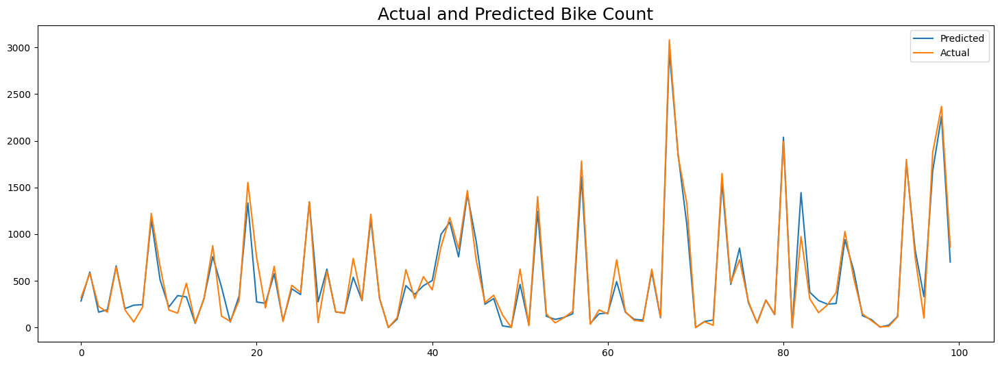

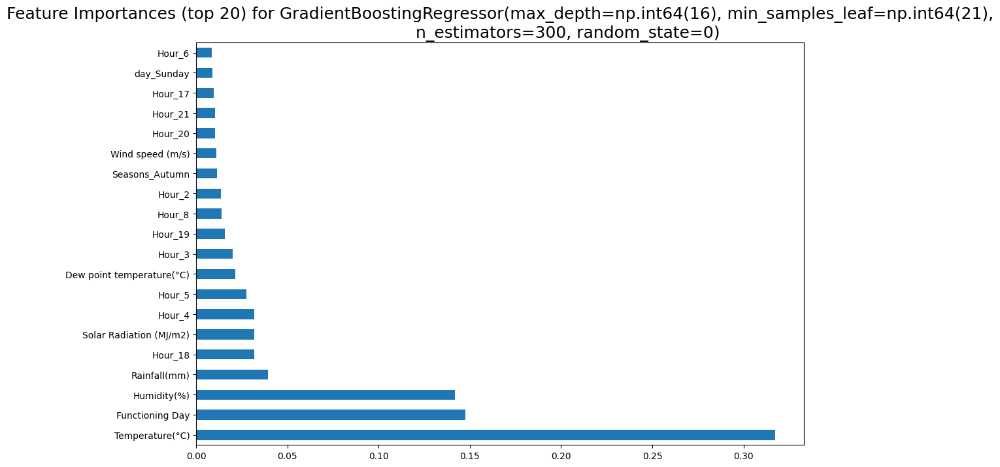

In [117]:
#Evaluation matrices for GradientBoosting
result = evaluate_model(gb_model, y_test,y_pred_gb)
check_score['Gradient Boosting Regressor Tuned'] = result

##### Which hyperparameter optimization technique have you used and why?

Randomized search cross-validation (CV) is used to efficiently explore the hyperparameter space of a machine learning model. It works by randomly sampling from the search space of hyperparameters, rather than exhaustively trying every possible combination. This allows for a more efficient search while still providing a good chance of finding good hyperparameter values. Additionally, by using cross-validation to evaluate the performance of each set of hyperparameters, one can ensure that the model is not overfitting to the training data.

Because of its randomly sampling technique and to save the time we have decided to use Randomised search CV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [118]:
check_score

,Linear regression,Lasso regression,Lasso with alpha = 0.001,Ridge,Ridge with alpha = 30,Random forest,Random forest tuned,Gradient Boosting Regressor,Gradient Boosting Regressor Tuned
MSE,88338.636889,190005.604758,88388.833045,88349.765799,88678.740170,41137.241689,71994.864843,72224.993623,27746.190042
RMSE,201.720179,292.029383,201.771992,201.733108,202.117715,114.347762,163.567567,177.202845,95.354525
MAE,297.218164,435.896323,297.302595,297.236885,297.789758,202.823178,268.318588,268.747081,166.571877
Train R2,0.783643,0.542022,0.783546,0.783620,0.782916,0.988322,0.863118,0.840396,0.996701
Test R2,0.788927,0.546009,0.788807,0.788901,0.788115,0.901708,0.827979,0.827429,0.933704
Adjusted R2,0.781567,0.530178,0.781443,0.781540,0.780726,0.898281,0.821980,0.821411,0.931393


After using the Randomised search CV our model performs very well it gave accuracy 99% on train data & 93% on test data which is very good model accuracy. But it is overfitting the modelas training accuracy is almost 100%.

### Plot R2 scores for each model

In [119]:
check_score.columns

Index(['Linear regression', 'Lasso regression', 'Lasso with alpha = 0.001',
       'Ridge', 'Ridge with alpha = 30', 'Random forest',
       'Random forest tuned', 'Gradient Boosting Regressor',
       'Gradient Boosting Regressor Tuned'],
      dtype='object')

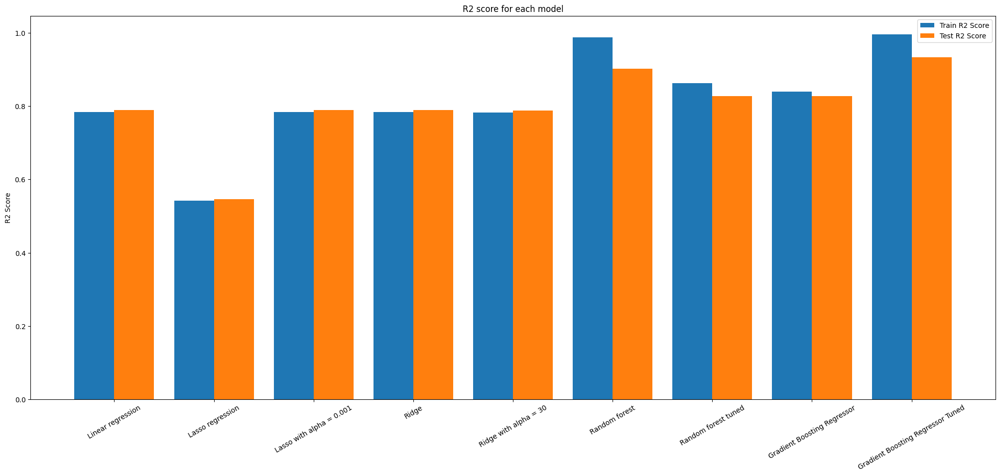

In [120]:
# R2 Scores plot

models = list(check_score.columns)
train = check_score.iloc[-3,:]
test = check_score.iloc[-2,:]

X_axis = np.arange(len(models))

plt.figure(figsize=(25,10))
plt.bar(X_axis - 0.2, train, 0.4, label = 'Train R2 Score')
plt.bar(X_axis + 0.2, test, 0.4, label = 'Test R2 Score')


plt.xticks(X_axis,models, rotation=30)
plt.ylabel("R2 Score")
plt.title("R2 score for each model")
plt.legend()
plt.show()

### Plot of adjusted R2 score

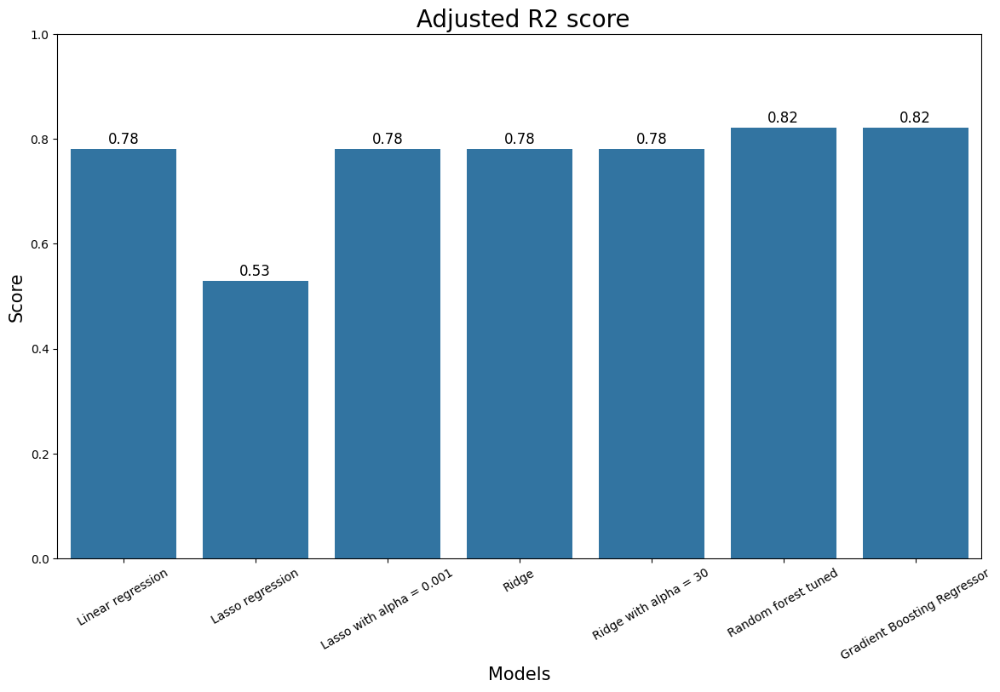

In [121]:
# Removing the overfitted models which have more than 5% gap between train and test values
score_t = check_score.transpose()            #taking transpose of the score dataframe to create new difference column
score_t['diff']=score_t['Train R2']-score_t['Test R2']                   #creating new column diff of train R2 and test R2 score
remove_models = list(score_t[score_t['diff']>=.05].index)                #creating a list of models which have difference more than .05 that is 5%
remove_models

adj = score_t['Adjusted R2'].drop(remove_models)                     #creating a new dataframe with required models and adjusted r2 score

plt.figure(figsize=(14,8))
plots = sns.barplot(x=list(adj.index), y=adj)
for bar in plots.patches:
  plots.annotate(format(bar.get_height(),'.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=12, xytext=(0, 8),
                   textcoords='offset points')
plt.xticks(rotation=30)

plt.title(" Adjusted R2 score", fontsize = 20)
plt.xlabel('Models', fontsize = 15)
plt.ylabel('Score', fontsize = 15)
# Setting limit of the y axis from 0 to 30
plt.ylim(0,1)
plt.show()

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

On the basis of all the model we have decided to select R2 score Evaluation matrics which shows the accuracy of the model which is very good indicator to check the feasibility of the model.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

We have ran a several models like linear regression, decision tree, random forest, gradient boosting, and xtreame gradient boosting but amongst them we have selected xtreame gradient boosting regressor (tuned) as we achieved 93% training accuracy and 90% testing accuracy. Some models were overfitted so we did not consider them.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [122]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [123]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***